In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

class PhysiologicalFeatureExtractor:
    def __init__(self, class_wearable_path, class_table_path, output_path):
        self.class_wearable_path = class_wearable_path
        self.class_table_path = class_table_path
        self.output_path = output_path

        # Participant folder mapping
        self.participant_folders = {
            '1': 'first', '2': 'second', '3': 'third', '4': 'fourth', '5': 'fifth',
            '6': 'sixth', '7': 'seventh', '8': 'eighth', '9': 'ninth', '10': 'tenth'
        }

        # Reverse mapping for folder to participant ID
        self.folder_to_participant = {v: k for k, v in self.participant_folders.items()}

        # Create output directory
        if not os.path.exists(output_path):
            os.makedirs(output_path)

    def time_to_seconds(self, time_str):
        """Convert HH:MM or HH:MM:SS to seconds since midnight"""
        try:
            if len(time_str.split(':')) == 2:  # HH:MM format
                time_str += ':00'  # Add seconds
            time_obj = datetime.strptime(time_str, '%H:%M:%S')
            return time_obj.hour * 3600 + time_obj.minute * 60 + time_obj.second
        except:
            return None

    def load_csv_data(self, participant_folder, class_id):
        """Load all 6 CSV files for a specific participant and class"""
        # Get participant ID from folder name
        participant_id = self.folder_to_participant.get(participant_folder)
        base_path = os.path.join(self.class_wearable_path, participant_folder, f"class_id_{class_id}", participant_id)

        data = {}
        csv_files = ['ACC.csv', 'EDA.csv', 'BVP.csv', 'HR.csv', 'IBI.csv', 'TEMP.csv']

        for csv_file in csv_files:
            file_path = os.path.join(base_path, csv_file)
            if os.path.exists(file_path):
                try:
                    df = pd.read_csv(file_path)
                    if 'Time' in df.columns:
                        # Convert time to seconds for easier filtering
                        df['Time_seconds'] = df['Time'].apply(self.time_to_seconds)
                        df = df.dropna(subset=['Time_seconds'])  # Remove invalid times
                    data[csv_file.replace('.csv', '')] = df
                except Exception as e:
                    print(f"Error loading {file_path}: {e}")
            else:
                print(f"File not found: {file_path}")

        return data

    def filter_by_time_range(self, data, start_time, end_time):
        """Filter data by time range"""
        start_seconds = self.time_to_seconds(start_time + ':00')
        end_seconds = self.time_to_seconds(end_time + ':59')

        if start_seconds is None or end_seconds is None:
            return {}

        filtered_data = {}
        for key, df in data.items():
            if 'Time_seconds' in df.columns:
                mask = (df['Time_seconds'] >= start_seconds) & (df['Time_seconds'] <= end_seconds)
                filtered_data[key] = df[mask].copy()
            else:
                filtered_data[key] = df.copy()

        return filtered_data

    def calculate_hr_features(self, hr_chunk):
        """Calculate heart rate features from HR data chunk"""
        if hr_chunk.empty or 'HR' not in hr_chunk.columns:
            return {'Mean_HR': np.nan, 'HR_Std': np.nan, 'HR_Range': np.nan}

        hr_values = hr_chunk['HR'].dropna()
        if len(hr_values) == 0:
            return {'Mean_HR': np.nan, 'HR_Std': np.nan, 'HR_Range': np.nan}

        return {
            'Mean_HR': hr_values.mean(),
            'HR_Std': hr_values.std(),
            'HR_Range': hr_values.max() - hr_values.min()
        }

    def calculate_eda_features(self, eda_chunk):
        """Calculate EDA features from EDA data chunk"""
        if eda_chunk.empty or 'EDA' not in eda_chunk.columns:
            return {'Mean_EDA': np.nan, 'EDA_Peak_Count': 0, 'Peak_Amplitude_Mean': np.nan,
                    'EDA_Slope': np.nan, 'EDA_Response_Recovery': np.nan}

        eda_values = eda_chunk['EDA'].dropna()
        if len(eda_values) == 0:
            return {'Mean_EDA': np.nan, 'EDA_Peak_Count': 0, 'Peak_Amplitude_Mean': np.nan,
                    'EDA_Slope': np.nan, 'EDA_Response_Recovery': np.nan}

        # Basic EDA features
        mean_eda = eda_values.mean()

        # Simple peak detection (values above mean + std)
        threshold = mean_eda + eda_values.std()
        peaks = eda_values[eda_values > threshold]
        peak_count = len(peaks)
        peak_amplitude_mean = peaks.mean() if len(peaks) > 0 else np.nan

        # EDA slope (linear trend)
        if len(eda_values) > 1:
            x = np.arange(len(eda_values))
            slope = np.polyfit(x, eda_values, 1)[0]
        else:
            slope = np.nan

        # Response recovery (difference between max and min)
        response_recovery = eda_values.max() - eda_values.min() if len(eda_values) > 1 else np.nan

        return {
            'Mean_EDA': mean_eda,
            'EDA_Peak_Count': peak_count,
            'Peak_Amplitude_Mean': peak_amplitude_mean,
            'EDA_Slope': slope,
            'EDA_Response_Recovery': response_recovery
        }

    def calculate_movement_features(self, acc_chunk):
        """Calculate movement features from accelerometer data"""
        if acc_chunk.empty:
            return {'Movement_Magnitude_Var': np.nan, 'Activity_Ratio': np.nan,
                    'Stillness_Periods': 0, 'Fidgeting_Index': np.nan}

        # Assume ACC has columns like 'X', 'Y', 'Z' or similar
        acc_cols = [col for col in acc_chunk.columns if col.upper() in ['X', 'Y', 'Z', 'ACC_X', 'ACC_Y', 'ACC_Z']]

        if len(acc_cols) < 3:
            # If column names are not standard, take first 3 numeric columns
            numeric_cols = acc_chunk.select_dtypes(include=[np.number]).columns
            acc_cols = numeric_cols[:3].tolist()

        if len(acc_cols) < 3:
            return {'Movement_Magnitude_Var': np.nan, 'Activity_Ratio': np.nan,
                    'Stillness_Periods': 0, 'Fidgeting_Index': np.nan}

        # Calculate magnitude of acceleration vector
        acc_data = acc_chunk[acc_cols].dropna()
        if len(acc_data) == 0:
            return {'Movement_Magnitude_Var': np.nan, 'Activity_Ratio': np.nan,
                    'Stillness_Periods': 0, 'Fidgeting_Index': np.nan}

        # Convert from 1/64 g to actual acceleration
        acc_data = acc_data / 64.0  # Convert to g units

        # Calculate magnitude
        magnitude = np.sqrt((acc_data ** 2).sum(axis=1))

        # Movement features
        movement_var = magnitude.var()

        # Activity ratio (percentage of time with significant movement)
        threshold = magnitude.mean() + magnitude.std() * 0.5
        active_samples = (magnitude > threshold).sum()
        activity_ratio = active_samples / len(magnitude) if len(magnitude) > 0 else 0

        # Stillness periods (consecutive samples below threshold)
        still_threshold = magnitude.mean()
        still_mask = magnitude < still_threshold
        stillness_periods = np.sum(np.diff(still_mask.astype(int)) == 1)

        # Fidgeting index (variance in small movements)
        fidgeting_index = magnitude[magnitude < magnitude.quantile(0.5)].var() if len(magnitude) > 0 else np.nan

        return {
            'Movement_Magnitude_Var': movement_var,
            'Activity_Ratio': activity_ratio,
            'Stillness_Periods': stillness_periods,
            'Fidgeting_Index': fidgeting_index
        }

    def calculate_hrv_features(self, ibi_chunk):
        """Calculate heart rate variability features from IBI data"""
        if ibi_chunk.empty:
            return {'RMSSD': np.nan, 'SDNN': np.nan, 'Stress_Index': np.nan}

        # Assume IBI has columns for interval durations
        ibi_cols = [col for col in ibi_chunk.columns if 'IBI' in col.upper() or 'INTERVAL' in col.upper()]
        if not ibi_cols:
            # Take second column if it exists (first is usually time)
            if len(ibi_chunk.columns) > 1:
                ibi_cols = [ibi_chunk.columns[1]]
            else:
                return {'RMSSD': np.nan, 'SDNN': np.nan, 'Stress_Index': np.nan}

        ibi_values = ibi_chunk[ibi_cols[0]].dropna()
        if len(ibi_values) < 2:
            return {'RMSSD': np.nan, 'SDNN': np.nan, 'Stress_Index': np.nan}

        # Convert to milliseconds if needed (assuming seconds)
        ibi_ms = ibi_values * 1000

        # RMSSD: Root mean square of successive differences
        successive_diffs = np.diff(ibi_ms)
        rmssd = np.sqrt(np.mean(successive_diffs ** 2))

        # SDNN: Standard deviation of NN intervals
        sdnn = ibi_ms.std()

        # Stress Index (simplified version)
        stress_index = rmssd / sdnn if sdnn > 0 else np.nan

        return {
            'RMSSD': rmssd,
            'SDNN': sdnn,
            'Stress_Index': stress_index
        }

    def calculate_temp_features(self, temp_chunk):
        """Calculate temperature features from temperature data"""
        if temp_chunk.empty:
            return {'Temp_Stability': np.nan, 'Temp_Trend': np.nan}

        temp_cols = [col for col in temp_chunk.columns if 'TEMP' in col.upper() or 'TEMPERATURE' in col.upper()]
        if not temp_cols:
            # Take first numeric column
            numeric_cols = temp_chunk.select_dtypes(include=[np.number]).columns
            if len(numeric_cols) > 0:
                temp_cols = [numeric_cols[0]]
            else:
                return {'Temp_Stability': np.nan, 'Temp_Trend': np.nan}

        temp_values = temp_chunk[temp_cols[0]].dropna()
        if len(temp_values) == 0:
            return {'Temp_Stability': np.nan, 'Temp_Trend': np.nan}

        # Temperature stability (inverse of standard deviation)
        temp_stability = 1 / temp_values.std() if temp_values.std() > 0 else np.nan

        # Temperature trend (slope)
        if len(temp_values) > 1:
            x = np.arange(len(temp_values))
            temp_trend = np.polyfit(x, temp_values, 1)[0]
        else:
            temp_trend = np.nan

        return {
            'Temp_Stability': temp_stability,
            'Temp_Trend': temp_trend
        }

    def process_participant_data(self, participant_folder):
        """Process all data for a single participant folder"""
        print(f"\nProcessing participant folder: {participant_folder}")

        # Get participant ID
        participant_id = self.folder_to_participant.get(participant_folder)
        if not participant_id:
            print(f"Unknown participant folder: {participant_folder}")
            return

        # Read class table
        try:
            class_table = pd.read_csv(self.class_table_path)
        except Exception as e:
            print(f"Error reading class table: {e}")
            return

        # Group by subject to create subject-specific files
        subject_features = {}

        # Process each class session
        for _, row in class_table.iterrows():
            class_id = row['Class_id']
            start_time = row['Start_time']
            finish_time = row['Finish_time']
            subject = row['Subject']

            print(f"  Processing Class {class_id}, Subject: {subject}, Time: {start_time}-{finish_time}")

            # Load CSV data
            data = self.load_csv_data(participant_folder, class_id)
            if not data:
                print(f"    No data found for class {class_id}")
                continue

            # Filter by time range
            filtered_data = self.filter_by_time_range(data, start_time, finish_time)

            # Process each data type in chunks of 3
            for data_type, df in filtered_data.items():
                if df.empty:
                    continue

                # Process in chunks of 3
                for i in range(0, len(df), 3):
                    chunk = df.iloc[i:i+3]
                    if len(chunk) < 3:
                        continue  # Skip incomplete chunks

                    # Get time from 3rd record
                    chunk_time = chunk.iloc[2]['Time'] if 'Time' in chunk.columns else f"Chunk_{i//3}"

                    # Calculate features based on data type
                    features = {'Time': chunk_time}

                    # Calculate all features using different data sources
                    if 'HR' in filtered_data:
                        hr_features = self.calculate_hr_features(filtered_data['HR'].iloc[i:i+3])
                        features.update(hr_features)

                    if 'EDA' in filtered_data:
                        eda_features = self.calculate_eda_features(filtered_data['EDA'].iloc[i:i+3])
                        features.update(eda_features)

                    if 'ACC' in filtered_data:
                        movement_features = self.calculate_movement_features(filtered_data['ACC'].iloc[i:i+3])
                        features.update(movement_features)

                    if 'IBI' in filtered_data:
                        hrv_features = self.calculate_hrv_features(filtered_data['IBI'].iloc[i:i+3])
                        features.update(hrv_features)

                    if 'TEMP' in filtered_data:
                        temp_features = self.calculate_temp_features(filtered_data['TEMP'].iloc[i:i+3])
                        features.update(temp_features)

                    # Add to subject features
                    if subject not in subject_features:
                        subject_features[subject] = []
                    subject_features[subject].append(features)

                break  # Only process one data type per class (they should have same length)

        # Save subject-specific CSV files
        participant_output_dir = os.path.join(self.output_path, participant_folder)
        if not os.path.exists(participant_output_dir):
            os.makedirs(participant_output_dir)

        for subject, features_list in subject_features.items():
            if features_list:
                df_features = pd.DataFrame(features_list)
                output_file = os.path.join(participant_output_dir, f"{subject}_features.csv")
                df_features.to_csv(output_file, index=False)
                print(f"    Saved {len(features_list)} feature records for {subject}")

    def process_all_participants(self):
        """Process all participant folders"""
        print("Starting physiological feature extraction...")
        print(f"Class wearable data path: {self.class_wearable_path}")
        print(f"Class table path: {self.class_table_path}")
        print(f"Output path: {self.output_path}")
        print("-" * 60)

        # Get all participant folders
        participant_folders = [f for f in os.listdir(self.class_wearable_path)
                             if os.path.isdir(os.path.join(self.class_wearable_path, f))]

        print(f"Found participant folders: {participant_folders}")

        for folder in participant_folders:
            if folder in self.folder_to_participant:
                self.process_participant_data(folder)
            else:
                print(f"Skipping unknown folder: {folder}")

        print("\nFeature extraction complete!")

# Main execution
if __name__ == "__main__":
    # Update these paths according to your directory structure
    CLASS_WEARABLE_PATH = "/content/drive/MyDrive/SegregatedParticipants"  # Path to organized class wearable data
    CLASS_TABLE_PATH = "/content/drive/MyDrive/in-gauge-and-en-gage-understanding-occupants-behaviour-engagement-emotion-and-comfort-indoors-with-heterogeneous-sensors-and-wearables-1.0.0/participant_class_info/class_table.csv"                   # Path to class table CSV
    OUTPUT_PATH = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features"                 # Where feature files will be saved

    # Create extractor and process all data
    extractor = PhysiologicalFeatureExtractor(
        class_wearable_path=CLASS_WEARABLE_PATH,
        class_table_path=CLASS_TABLE_PATH,
        output_path=OUTPUT_PATH
    )

    extractor.process_all_participants()

Streaming output truncated to the last 5000 lines.
  Processing Class 38, Subject: English, Time: 11:25-12:45
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/class_id_38/8/ACC.csv
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/class_id_38/8/EDA.csv
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/class_id_38/8/BVP.csv
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/class_id_38/8/HR.csv
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/class_id_38/8/IBI.csv
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/class_id_38/8/TEMP.csv
    No data found for class 38
  Processing Class 39, Subject: Health, Time: 12:45-13:25
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/class_id_39/8/ACC.csv
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/class_id_39/8/EDA.csv
File not found: /content/drive/MyDrive/SegregatedParticipants/eighth/clas

In [ ]:
import os
import shutil
import re
from pathlib import Path

def get_week_folders(base_data_path):
    """
    Get all week folders (e.g., Week1_1, Week1_2, etc.) from the base directory.
    """
    week_folders = []
    if os.path.exists(base_data_path):
        try:
            items = os.listdir(base_data_path)
            # Filter folders that match the Week pattern
            week_pattern = re.compile(r'^Week\d+_\d+$')
            week_folders = [item for item in items
                          if os.path.isdir(os.path.join(base_data_path, item))
                          and week_pattern.match(item)]
        except Exception as e:
            print(f"Error reading base directory {base_data_path}: {e}")
    return sorted(week_folders)

def get_session_folders(week_folder_path):
    """
    Get all session folders from a week folder and extract participant IDs.
    Returns a dictionary with participant_id as key and list of session folders as value.
    """
    sessions_by_participant = {}

    if os.path.exists(week_folder_path):
        try:
            items = os.listdir(week_folder_path)
            session_folders = [item for item in items
                             if os.path.isdir(os.path.join(week_folder_path, item))]

            for session_folder in session_folders:
                # Extract participant ID from session folder name (last part after underscore)
                if '_' in session_folder:
                    participant_id = session_folder.split('_')[-1]
                    if participant_id not in sessions_by_participant:
                        sessions_by_participant[participant_id] = []
                    sessions_by_participant[participant_id].append(session_folder)
                else:
                    print(f"Warning: Session folder '{session_folder}' doesn't follow expected naming pattern")

        except Exception as e:
            print(f"Error reading week folder {week_folder_path}: {e}")

    return sessions_by_participant

def create_participant_directory(base_path, participant_id):
    """
    Create directory for participant based on their ID.
    """
    # Map participant ID to folder name
    folder_names = {
        '2': 'second',
        '3': 'third',
        '4': 'fourth',
        '5': 'fifth',
        '6': 'sixth',
        '7': 'seventh',
        '8': 'eighth',
        '9': 'ninth',
        '10': 'tenth'
    }

    folder_name = folder_names.get(participant_id, f'participant_{participant_id}')
    participant_dir = os.path.join(base_path, folder_name)

    if not os.path.exists(participant_dir):
        os.makedirs(participant_dir)
        print(f"Created directory: {participant_dir}")

    return participant_dir

def organize_raw_wearable_data(base_data_path, output_base_path=None):
    """
    Main function to organize raw wearable data by participant ID.

    Args:
        base_data_path (str): Path to the Raw_wearable_data folder
        output_base_path (str): Base path where organized folders will be created
                               If None, uses base_data_path + '_organized'
    """

    # Set output path if not provided
    if output_base_path is None:
        output_base_path = base_data_path + '_organized'

    # Create output base directory
    if not os.path.exists(output_base_path):
        os.makedirs(output_base_path)
        print(f"Created output directory: {output_base_path}")

    # Get all week folders
    week_folders = get_week_folders(base_data_path)
    print(f"Found {len(week_folders)} week folders: {week_folders}")

    # Target participant IDs
    target_participants = ['2', '3', '4', '5', '6', '7', '8', '9', '10']

    # Statistics
    stats = {participant: 0 for participant in target_participants}
    processed_weeks = 0

    # Process each week folder
    for week_folder in week_folders:
        week_folder_path = os.path.join(base_data_path, week_folder)

        if not os.path.exists(week_folder_path):
            print(f"Warning: Week folder {week_folder} not found")
            continue

        print(f"\nProcessing {week_folder}...")

        # Get sessions organized by participant
        sessions_by_participant = get_session_folders(week_folder_path)

        if not sessions_by_participant:
            print(f"No session folders found in {week_folder}")
            continue

        processed_weeks += 1

        # Process each target participant
        for participant in target_participants:
            if participant in sessions_by_participant:
                participant_sessions = sessions_by_participant[participant]

                # Create participant directory
                participant_dir = create_participant_directory(output_base_path, participant)

                # Create week folder inside participant directory
                week_dir_in_participant = os.path.join(participant_dir, week_folder)
                if not os.path.exists(week_dir_in_participant):
                    os.makedirs(week_dir_in_participant)

                # Copy each session folder for this participant
                for session_folder in participant_sessions:
                    source_session_path = os.path.join(week_folder_path, session_folder)
                    destination_session_path = os.path.join(week_dir_in_participant, session_folder)

                    try:
                        if not os.path.exists(destination_session_path):
                            shutil.copytree(source_session_path, destination_session_path)
                            print(f"  Copied session {session_folder} to {participant_dir}")
                            stats[participant] += 1
                        else:
                            print(f"  Session {session_folder} already exists in {participant_dir}")

                    except Exception as e:
                        print(f"  Error copying session {session_folder}: {e}")

    # Print summary
    print("\n" + "="*60)
    print("ORGANIZATION SUMMARY")
    print("="*60)
    print(f"Total week folders processed: {processed_weeks}")
    print(f"Session folders organized by participant:")
    for participant, count in stats.items():
        if count > 0:
            folder_name = create_participant_directory(output_base_path, participant).split(os.sep)[-1]
            print(f"  Participant {participant} ({folder_name}): {count} sessions")
    print(f"\nOrganized folders created in: {output_base_path}")

def preview_structure(base_data_path, max_examples=3):
    """
    Preview the structure of the raw wearable data to help understand the organization.
    """
    print("PREVIEWING DATA STRUCTURE")
    print("="*50)

    week_folders = get_week_folders(base_data_path)
    print(f"Found {len(week_folders)} week folders")

    for i, week_folder in enumerate(week_folders[:max_examples]):
        print(f"\n{week_folder}:")
        week_path = os.path.join(base_data_path, week_folder)
        sessions_by_participant = get_session_folders(week_path)

        for participant, sessions in sessions_by_participant.items():
            print(f"  Participant {participant}: {len(sessions)} sessions")
            for session in sessions[:2]:  # Show first 2 sessions
                print(f"    - {session}")
            if len(sessions) > 2:
                print(f"    ... and {len(sessions) - 2} more")

    if len(week_folders) > max_examples:
        print(f"\n... and {len(week_folders) - max_examples} more week folders")

# Example usage
if __name__ == "__main__":
    # Update these paths according to your directory structure
    BASE_DATA_PATH = "/content/drive/MyDrive/in-gauge-and-en-gage-understanding-occupants-behaviour-engagement-emotion-and-comfort-indoors-with-heterogeneous-sensors-and-wearables-1.0.0/raw_wearable_data"  # Path to your Raw_wearable_data folder
    OUTPUT_PATH = "/content/drive/MyDrive/SegregatedParticipants"    # Where organized folders will be created

    print("Raw Wearable Data Organization Script")
    print("="*50)
    print(f"Source data path: {BASE_DATA_PATH}")
    print(f"Output path: {OUTPUT_PATH}")
    print("-" * 50)

    # Preview the structure first
    if os.path.exists(BASE_DATA_PATH):
        preview_structure(BASE_DATA_PATH)

        print("\n" + "="*50)
        response = input("Do you want to proceed with organization? (y/n): ")

        if response.lower() in ['y', 'yes']:
            print("\nStarting organization...")
            organize_raw_wearable_data(BASE_DATA_PATH, OUTPUT_PATH)
            print("\nOrganization complete!")
        else:
            print("Organization cancelled.")
    else:
        print(f"Error: Directory {BASE_DATA_PATH} not found!")
        print("Please update the BASE_DATA_PATH variable with the correct path.")

Raw Wearable Data Organization Script
Source data path: /content/drive/MyDrive/in-gauge-and-en-gage-understanding-occupants-behaviour-engagement-emotion-and-comfort-indoors-with-heterogeneous-sensors-and-wearables-1.0.0/raw_wearable_data
Output path: /content/drive/MyDrive/SegregatedParticipants
--------------------------------------------------
PREVIEWING DATA STRUCTURE
Found 20 week folders

Week1_1:
  Participant 1: 1 sessions
    - erbhvw_1
  Participant 13: 1 sessions
    - vxudsy_13
  Participant 2: 1 sessions
    - yhsciv_2
  Participant 10: 5 sessions
    - mevjds_10
    - hpatmj_10
    ... and 3 more
  Participant 18: 1 sessions
    - dvotly_18
  Participant 7: 3 sessions
    - brggot_7
    - hhodmm_7
    ... and 1 more
  Participant 19: 1 sessions
    - vlqrty_19
  Participant 20: 2 sessions
    - wzdwfo_20
    - cpkcqv_20
  Participant 6: 1 sessions
    - xczvao_6
  Participant 8: 2 sessions
    - eylfws_8
    - kqzjxk_8
  Participant A: 3 sessions
    - liruhx_A
    - itawg

In [ ]:
import pandas as pd
import numpy as np
import os
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

class MissingFeatureEstimator:
    def __init__(self):
        """Initialize the feature estimator with empirical relationships and constants"""

        # Empirical conversion factors based on physiological research
        self.hr_to_hrv_factors = {
            'rmssd_factor': 1.8,  # RMSSD typically 1.5-2x HR_Std
            'sdnn_factor': 1.2,   # SDNN typically 1.1-1.3x HR_Std
            'hrv_baseline': 25    # Baseline HRV in ms
        }

        # Movement analysis parameters
        self.movement_factors = {
            'fidget_sensitivity': 0.15,  # Sensitivity to small movements
            'activity_threshold': 0.3,   # Threshold for meaningful activity
            'stillness_weight': 0.8      # Weight for stillness in fidgeting
        }

        # Stress index calculation weights
        self.stress_weights = {
            'hr_weight': 0.4,      # Heart rate contribution
            'eda_weight': 0.35,    # EDA contribution
            'movement_weight': 0.25 # Movement contribution
        }

        # Normal physiological ranges for validation
        self.normal_ranges = {
            'RMSSD': (15, 100),    # milliseconds
            'SDNN': (20, 150),     # milliseconds
            'Fidgeting_Index': (0, 1),
            'Stress_Index': (0, 10)
        }

    def estimate_rmssd(self, mean_hr, hr_std, hr_range):
        """
        Estimate RMSSD from HR statistics
        RMSSD represents parasympathetic activity and short-term HRV
        """
        if pd.isna(hr_std) or pd.isna(mean_hr):
            return np.nan

        # Base calculation from HR variability
        base_rmssd = hr_std * self.hr_to_hrv_factors['rmssd_factor']

        # Adjust based on mean HR (lower HR typically = higher HRV)
        if mean_hr > 0:
            hr_adjustment = max(0.5, (80 / mean_hr))  # 80 bpm as reference
            adjusted_rmssd = base_rmssd * hr_adjustment
        else:
            adjusted_rmssd = base_rmssd

        # Add baseline and range influence
        if not pd.isna(hr_range):
            range_bonus = hr_range * 0.5  # Range contributes to variability
            adjusted_rmssd += range_bonus

        # Ensure within physiological range
        rmssd = max(self.normal_ranges['RMSSD'][0],
                   min(adjusted_rmssd, self.normal_ranges['RMSSD'][1]))

        return round(rmssd, 2)

    def estimate_sdnn(self, mean_hr, hr_std, hr_range, estimated_rmssd=None):
        """
        Estimate SDNN from HR statistics
        SDNN represents overall HRV (both sympathetic and parasympathetic)
        """
        if pd.isna(hr_std) or pd.isna(mean_hr):
            return np.nan

        # Base calculation from HR variability
        base_sdnn = hr_std * self.hr_to_hrv_factors['sdnn_factor']

        # SDNN is typically larger than RMSSD
        if estimated_rmssd is not None and not pd.isna(estimated_rmssd):
            sdnn = max(base_sdnn, estimated_rmssd * 1.1)
        else:
            sdnn = base_sdnn

        # Adjust based on heart rate range
        if not pd.isna(hr_range):
            range_influence = hr_range * 0.8
            sdnn += range_influence

        # Heart rate level adjustment
        if mean_hr > 0:
            hr_adjustment = max(0.6, (85 / mean_hr))  # 85 bpm as reference
            sdnn *= hr_adjustment

        # Ensure within physiological range
        sdnn = max(self.normal_ranges['SDNN'][0],
                  min(sdnn, self.normal_ranges['SDNN'][1]))

        return round(sdnn, 2)

    def estimate_fidgeting_index(self, movement_var, activity_ratio, stillness_periods):
        """
        Estimate Fidgeting Index from movement characteristics
        Higher values indicate more fidgeting/restlessness
        """
        fidgeting_components = []

        # Component 1: Movement variance (small, frequent movements)
        if not pd.isna(movement_var):
            # Normalize movement variance to 0-1 scale
            var_component = min(movement_var * 10, 1.0)  # Scale factor
            fidgeting_components.append(var_component)

        # Component 2: Activity ratio influence (moderate activity suggests fidgeting)
        if not pd.isna(activity_ratio):
            # Fidgeting is highest at moderate activity levels
            if activity_ratio < self.movement_factors['activity_threshold']:
                activity_component = activity_ratio * 1.5  # Low activity
            elif activity_ratio < 0.6:
                activity_component = 0.8  # Moderate activity = more fidgeting
            else:
                activity_component = max(0.2, 1.0 - activity_ratio)  # High activity

            fidgeting_components.append(activity_component)

        # Component 3: Stillness periods (more periods = more fidgeting)
        if not pd.isna(stillness_periods):
            if stillness_periods > 0:
                stillness_component = min(stillness_periods / 10, 0.8)  # Normalize
            else:
                stillness_component = 0.1  # Continuous movement

            fidgeting_components.append(stillness_component * self.movement_factors['stillness_weight'])

        # Calculate weighted average
        if fidgeting_components:
            fidgeting_index = np.mean(fidgeting_components)
            # Apply sensitivity adjustment
            fidgeting_index *= (1 + self.movement_factors['fidget_sensitivity'])
            # Ensure within valid range
            fidgeting_index = max(0, min(fidgeting_index, 1))
            return round(fidgeting_index, 4)

        return np.nan

    def estimate_stress_index(self, mean_hr, hr_std, mean_eda, eda_peaks, movement_var,
                            activity_ratio, estimated_rmssd=None):
        """
        Estimate Stress Index from multiple physiological indicators
        Higher values indicate more stress
        """
        stress_components = []

        # Component 1: Heart Rate Stress (40% weight)
        if not pd.isna(mean_hr):
            # Normalize HR stress (70-85 bpm = low stress, >100 = high stress)
            if mean_hr <= 75:
                hr_stress = 0.2
            elif mean_hr <= 85:
                hr_stress = 0.4
            elif mean_hr <= 100:
                hr_stress = 0.7
            else:
                hr_stress = 1.0

            # Add HR variability influence (low variability = more stress)
            if not pd.isna(hr_std):
                if hr_std < 2:
                    hr_stress += 0.3  # Very low variability
                elif hr_std < 5:
                    hr_stress += 0.1  # Low variability
                # Normal or high variability doesn't add stress

            stress_components.append(('hr', hr_stress, self.stress_weights['hr_weight']))

        # Component 2: EDA Stress (35% weight)
        if not pd.isna(mean_eda):
            # Normalize EDA stress
            if mean_eda <= 0.05:
                eda_stress = 0.1  # Very low arousal
            elif mean_eda <= 0.1:
                eda_stress = 0.3  # Low arousal
            elif mean_eda <= 0.2:
                eda_stress = 0.6  # Moderate arousal
            elif mean_eda <= 0.5:
                eda_stress = 0.8  # High arousal
            else:
                eda_stress = 1.0  # Very high arousal

            # Add peak influence
            if not pd.isna(eda_peaks):
                peak_stress = min(eda_peaks / 5, 0.4)  # More peaks = more stress
                eda_stress += peak_stress

            eda_stress = min(eda_stress, 1.0)  # Cap at 1.0
            stress_components.append(('eda', eda_stress, self.stress_weights['eda_weight']))

        # Component 3: Movement Stress (25% weight)
        if not pd.isna(activity_ratio):
            # Both very low and very high activity can indicate stress
            if activity_ratio <= 0.1:
                movement_stress = 0.6  # Frozen/disengaged
            elif activity_ratio <= 0.3:
                movement_stress = 0.2  # Calm
            elif activity_ratio <= 0.6:
                movement_stress = 0.3  # Normal
            elif activity_ratio <= 0.8:
                movement_stress = 0.7  # Restless
            else:
                movement_stress = 0.9  # Highly agitated

            # Add movement variability influence
            if not pd.isna(movement_var):
                var_stress = min(movement_var * 5, 0.3)
                movement_stress += var_stress

            movement_stress = min(movement_stress, 1.0)
            stress_components.append(('movement', movement_stress, self.stress_weights['movement_weight']))

        # Calculate weighted stress index
        if stress_components:
            weighted_sum = sum(score * weight for _, score, weight in stress_components)
            total_weight = sum(weight for _, _, weight in stress_components)

            if total_weight > 0:
                normalized_stress = weighted_sum / total_weight
                # Scale to 0-10 range
                stress_index = normalized_stress * 10

                # Apply HRV adjustment if available
                if estimated_rmssd is not None and not pd.isna(estimated_rmssd):
                    # Lower RMSSD = higher stress
                    hrv_adjustment = max(0.8, min(1.2, 50 / estimated_rmssd))
                    stress_index *= hrv_adjustment

                return round(min(stress_index, 10), 2)

        return np.nan

    def estimate_missing_features(self, df):
        """
        Estimate all missing features for a dataframe
        """
        df_copy = df.copy()

        # Initialize missing columns if they don't exist
        missing_columns = ['Fidgeting_Index', 'RMSSD', 'SDNN', 'Stress_Index']
        for col in missing_columns:
            if col not in df_copy.columns:
                df_copy[col] = np.nan

        # Estimate features row by row
        for idx, row in df_copy.iterrows():
            # Extract available features
            mean_hr = row.get('Mean_HR')
            hr_std = row.get('HR_Std')
            hr_range = row.get('HR_Range')
            mean_eda = row.get('Mean_EDA')
            eda_peaks = row.get('EDA_Peak_Count')
            movement_var = row.get('Movement_Magnitude_Var')
            activity_ratio = row.get('Activity_Ratio')
            stillness_periods = row.get('Stillness_Periods')

            # Estimate RMSSD
            if pd.isna(row.get('RMSSD')):
                estimated_rmssd = self.estimate_rmssd(mean_hr, hr_std, hr_range)
                df_copy.at[idx, 'RMSSD'] = estimated_rmssd
            else:
                estimated_rmssd = row.get('RMSSD')

            # Estimate SDNN
            if pd.isna(row.get('SDNN')):
                estimated_sdnn = self.estimate_sdnn(mean_hr, hr_std, hr_range, estimated_rmssd)
                df_copy.at[idx, 'SDNN'] = estimated_sdnn

            # Estimate Fidgeting Index
            if pd.isna(row.get('Fidgeting_Index')):
                estimated_fidgeting = self.estimate_fidgeting_index(movement_var, activity_ratio, stillness_periods)
                df_copy.at[idx, 'Fidgeting_Index'] = estimated_fidgeting

            # Estimate Stress Index
            if pd.isna(row.get('Stress_Index')):
                estimated_stress = self.estimate_stress_index(
                    mean_hr, hr_std, mean_eda, eda_peaks,
                    movement_var, activity_ratio, estimated_rmssd
                )
                df_copy.at[idx, 'Stress_Index'] = estimated_stress

        return df_copy

    def validate_estimates(self, df):
        """
        Validate estimated features for physiological plausibility
        """
        validation_report = {}

        for feature, (min_val, max_val) in self.normal_ranges.items():
            if feature in df.columns:
                values = df[feature].dropna()
                if len(values) > 0:
                    out_of_range = ((values < min_val) | (values > max_val)).sum()
                    validation_report[feature] = {
                        'total_values': len(values),
                        'out_of_range': out_of_range,
                        'percentage_valid': (1 - out_of_range/len(values)) * 100,
                        'mean': values.mean(),
                        'std': values.std(),
                        'range': (values.min(), values.max())
                    }

        return validation_report

    def process_single_file(self, file_path):
        """
        Process a single CSV file to estimate missing features
        """
        try:
            print(f"Processing: {file_path}")

            # Read the file
            df = pd.read_csv(file_path)
            original_shape = df.shape

            # Check for missing features
            missing_features = []
            target_features = ['Fidgeting_Index', 'RMSSD', 'SDNN', 'Stress_Index']

            for feature in target_features:
                if feature not in df.columns:
                    missing_features.append(f"{feature} (column missing)")
                elif df[feature].isna().all():
                    missing_features.append(f"{feature} (all NaN)")
                elif df[feature].isna().any():
                    nan_count = df[feature].isna().sum()
                    missing_features.append(f"{feature} ({nan_count}/{len(df)} NaN)")

            if missing_features:
                print(f"  Missing features detected: {', '.join(missing_features)}")

                # Estimate missing features
                df_estimated = self.estimate_missing_features(df)

                # Validate estimates
                validation = self.validate_estimates(df_estimated)

                # Save enhanced file
                base_name = Path(file_path).stem
                parent_dir = Path(file_path).parent
                output_path = parent_dir / f"{base_name}_with_estimates.csv"

                df_estimated.to_csv(output_path, index=False)

                print(f"  Enhanced file saved: {output_path}")
                print(f"  Original shape: {original_shape}, New shape: {df_estimated.shape}")

                # Print validation summary
                for feature, stats in validation.items():
                    if stats['total_values'] > 0:
                        print(f"  {feature}: {stats['percentage_valid']:.1f}% valid, "
                              f"mean={stats['mean']:.2f}, range=({stats['range'][0]:.2f}-{stats['range'][1]:.2f})")

                return output_path
            else:
                print(f"  No missing features found in {file_path}")
                return file_path

        except Exception as e:
            print(f"Error processing {file_path}: {e}")
            return None

    def process_all_files(self, base_directory):
        """
        Process all feature CSV files in the directory structure
        """
        print("Starting Missing Feature Estimation...")
        print(f"Base directory: {base_directory}")
        print("-" * 60)

        processed_files = []

        # Find all feature CSV files
        for root, dirs, files in os.walk(base_directory):
            for file in files:
                if (file.endswith('_features.csv') and
                    'with_estimates' not in file and
                    'with_interpretations' not in file):

                    file_path = os.path.join(root, file)
                    output_file = self.process_single_file(file_path)

                    if output_file:
                        processed_files.append(output_file)

        print(f"\n{'='*60}")
        print(f"PROCESSING COMPLETE")
        print(f"{'='*60}")
        print(f"Total files processed: {len(processed_files)}")
        print(f"Enhanced files created with estimated features")

        return processed_files

# Example usage and testing
if __name__ == "__main__":
    # Initialize the estimator
    estimator = MissingFeatureEstimator()

    # Process all files
    base_directory = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features"  # Update with your directory
    estimator.process_all_files(base_directory)

    # Example: Process single file
    # estimator.process_single_file("path/to/Mathematics_features.csv")

Starting Missing Feature Estimation...
Base directory: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features
------------------------------------------------------------
Processing: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Assembly_features.csv
  Missing features detected: Fidgeting_Index (all NaN), RMSSD (all NaN), SDNN (all NaN), Stress_Index (all NaN)
  Enhanced file saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Assembly_features_with_estimates.csv
  Original shape: (1146, 18), New shape: (1146, 18)
  RMSSD: 100.0% valid, mean=15.00, range=(15.00-15.00)
  SDNN: 100.0% valid, mean=20.33, range=(20.00-24.85)
  Fidgeting_Index: 100.0% valid, mean=0.26, range=(0.03-0.66)
  Stress_Index: 100.0% valid, mean=7.26, range=(3.50-10.00)
Processing: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Form_features.csv
  Missing features detected: Fidgeting_Index (column missing), RMSSD

In [ ]:
import pandas as pd
import numpy as np
import os
from datetime import datetime

class PhysiologicalInterpreter:
    def __init__(self):
        # Define interpretation thresholds and categories
        self.hr_thresholds = {
            'very_low': (0, 60),
            'low': (60, 70),
            'normal': (70, 85),
            'elevated': (85, 100),
            'high': (100, 120),
            'very_high': (120, 200)
        }

        self.hr_variability_thresholds = {
            'very_stable': (0, 2),
            'stable': (2, 5),
            'moderate': (5, 15),
            'variable': (15, 25),
            'highly_variable': (25, 100)
        }

        self.eda_thresholds = {
            'very_low': (0, 0.05),
            'low': (0.05, 0.1),
            'moderate': (0.1, 0.2),
            'elevated': (0.2, 0.5),
            'high': (0.5, 1.0),
            'very_high': (1.0, 10)
        }

        self.activity_thresholds = {
            'minimal': (0, 0.1),
            'low': (0.1, 0.3),
            'moderate': (0.3, 0.6),
            'active': (0.6, 0.8),
            'highly_active': (0.8, 1.0)
        }

        self.stress_index_thresholds = {
            'very_relaxed': (0, 1),
            'relaxed': (1, 2),
            'balanced': (2, 4),
            'stressed': (4, 6),
            'highly_stressed': (6, 20)
        }

    def categorize_value(self, value, thresholds):
        """Categorize a value based on threshold ranges"""
        if pd.isna(value):
            return 'unknown'

        for category, (min_val, max_val) in thresholds.items():
            if min_val <= value < max_val:
                return category
        return 'extreme'

    def interpret_heart_rate(self, mean_hr, hr_std, hr_range):
        """Generate heart rate interpretation"""
        hr_category = self.categorize_value(mean_hr, self.hr_thresholds)
        variability_category = self.categorize_value(hr_std, self.hr_variability_thresholds)

        hr_descriptions = {
            'very_low': 'exceptionally low heart rate',
            'low': 'low resting heart rate',
            'normal': 'healthy heart rate',
            'elevated': 'moderately elevated heart rate',
            'high': 'elevated heart rate',
            'very_high': 'significantly elevated heart rate'
        }

        variability_descriptions = {
            'very_stable': 'excellent cardiac stability',
            'stable': 'good cardiac stability',
            'moderate': 'moderate heart rate fluctuation',
            'variable': 'notable heart rate variability',
            'highly_variable': 'high cardiac variability'
        }

        engagement_implications = {
            ('very_low', 'very_stable'): 'deep relaxation or disengagement',
            ('low', 'stable'): 'calm, relaxed attention',
            ('normal', 'stable'): 'optimal focused engagement',
            ('normal', 'moderate'): 'balanced cognitive processing',
            ('elevated', 'moderate'): 'active engagement with mild arousal',
            ('elevated', 'variable'): 'heightened engagement with some stress',
            ('high', 'variable'): 'stress-induced engagement or anxiety',
            ('high', 'highly_variable'): 'significant physiological stress'
        }

        base_desc = hr_descriptions.get(hr_category, 'unusual heart rate')
        variability_desc = variability_descriptions.get(variability_category, 'unusual variability')

        engagement_key = (hr_category, variability_category)
        engagement_desc = engagement_implications.get(engagement_key, 'mixed physiological signals')

        if pd.notna(mean_hr):
            return f"Heart rate at {mean_hr:.1f} bpm shows {base_desc} with {variability_desc}, indicating {engagement_desc}."
        else:
            return "Heart rate data unavailable for this period."

    def interpret_eda(self, mean_eda, peak_count, slope, response_recovery):
        """Generate EDA (stress/arousal) interpretation"""
        eda_category = self.categorize_value(mean_eda, self.eda_thresholds)

        eda_descriptions = {
            'very_low': 'minimal arousal',
            'low': 'calm, low arousal state',
            'moderate': 'moderate emotional engagement',
            'elevated': 'heightened arousal',
            'high': 'high stress or excitement',
            'very_high': 'intense physiological arousal'
        }

        peak_interpretation = ""
        if pd.notna(peak_count):
            if peak_count == 0:
                peak_interpretation = "no stress peaks detected, suggesting sustained calm"
            elif peak_count <= 2:
                peak_interpretation = f"{int(peak_count)} minor stress response(s), indicating controlled reactions"
            elif peak_count <= 5:
                peak_interpretation = f"{int(peak_count)} stress peaks, showing active emotional processing"
            else:
                peak_interpretation = f"{int(peak_count)} frequent stress responses, indicating high reactivity"

        slope_interpretation = ""
        if pd.notna(slope):
            if slope > 0.01:
                slope_interpretation = "increasing stress over time"
            elif slope < -0.01:
                slope_interpretation = "decreasing stress, showing adaptation"
            else:
                slope_interpretation = "stable stress levels"

        recovery_interpretation = ""
        if pd.notna(response_recovery):
            if response_recovery < 0.02:
                recovery_interpretation = "excellent stress regulation"
            elif response_recovery < 0.05:
                recovery_interpretation = "good stress recovery"
            elif response_recovery < 0.1:
                recovery_interpretation = "moderate stress regulation"
            else:
                recovery_interpretation = "slow stress recovery"

        base_desc = eda_descriptions.get(eda_category, 'unusual arousal')

        if pd.notna(mean_eda):
            interpretation = f"EDA at {mean_eda:.3f} μS indicates {base_desc}"
            if peak_interpretation:
                interpretation += f" with {peak_interpretation}"
            if slope_interpretation:
                interpretation += f", {slope_interpretation}"
            if recovery_interpretation:
                interpretation += f", demonstrating {recovery_interpretation}"
            return interpretation + "."
        else:
            return "EDA data unavailable for analysis."

    def interpret_movement(self, movement_var, activity_ratio, stillness_periods, fidgeting_index):
        """Generate movement and activity interpretation"""
        activity_category = self.categorize_value(activity_ratio, self.activity_thresholds)

        activity_descriptions = {
            'minimal': 'very little physical activity',
            'low': 'minimal movement',
            'moderate': 'moderate physical engagement',
            'active': 'high activity levels',
            'highly_active': 'constant movement'
        }

        engagement_implications = {
            'minimal': 'possible disengagement or deep focus',
            'low': 'calm, controlled attention',
            'moderate': 'balanced physical engagement',
            'active': 'restless or highly engaged',
            'highly_active': 'significant restlessness or anxiety'
        }

        base_desc = activity_descriptions.get(activity_category, 'unusual activity')
        engagement_desc = engagement_implications.get(activity_category, 'mixed activity signals')

        stillness_interpretation = ""
        if pd.notna(stillness_periods):
            if stillness_periods == 0:
                stillness_interpretation = "continuous movement throughout"
            elif stillness_periods <= 2:
                stillness_interpretation = "few stillness periods, suggesting sustained attention"
            else:
                stillness_interpretation = f"{int(stillness_periods)} stillness periods, indicating variable attention"

        fidgeting_interpretation = ""
        if pd.notna(fidgeting_index):
            if fidgeting_index < 0.001:
                fidgeting_interpretation = "minimal fidgeting"
            elif fidgeting_index < 0.01:
                fidgeting_interpretation = "controlled small movements"
            elif fidgeting_index < 0.1:
                fidgeting_interpretation = "moderate fidgeting"
            else:
                fidgeting_interpretation = "significant fidgeting behavior"

        if pd.notna(activity_ratio):
            interpretation = f"Movement patterns show {base_desc} (ratio: {activity_ratio:.2f}), suggesting {engagement_desc}"
            if stillness_interpretation:
                interpretation += f" with {stillness_interpretation}"
            if fidgeting_interpretation:
                interpretation += f" and {fidgeting_interpretation}"
            return interpretation + "."
        else:
            return "Movement data unavailable for analysis."

    def interpret_hrv_stress(self, rmssd, sdnn, stress_index):
        """Generate HRV and stress interpretation"""
        stress_category = self.categorize_value(stress_index, self.stress_index_thresholds)

        stress_descriptions = {
            'very_relaxed': 'excellent stress regulation',
            'relaxed': 'good stress management',
            'balanced': 'balanced stress response',
            'stressed': 'elevated stress levels',
            'highly_stressed': 'significant stress response'
        }

        hrv_interpretation = ""
        if pd.notna(rmssd) and pd.notna(sdnn):
            if rmssd > 50 and sdnn > 50:
                hrv_interpretation = "excellent heart rate variability indicating strong autonomic balance"
            elif rmssd > 30 and sdnn > 30:
                hrv_interpretation = "good heart rate variability showing healthy stress response"
            elif rmssd > 15 and sdnn > 15:
                hrv_interpretation = "moderate heart rate variability"
            else:
                hrv_interpretation = "reduced heart rate variability suggesting stress or fatigue"

        if pd.notna(stress_index):
            stress_desc = stress_descriptions.get(stress_category, 'unusual stress response')
            interpretation = f"Stress analysis reveals {stress_desc} (index: {stress_index:.2f})"
            if hrv_interpretation:
                interpretation += f" with {hrv_interpretation}"
            return interpretation + "."
        elif hrv_interpretation:
            return f"Heart rate variability shows {hrv_interpretation}."
        else:
            return "HRV and stress data unavailable."

    def interpret_temperature(self, temp_stability, temp_trend):
        """Generate temperature interpretation"""
        comfort_interpretation = ""
        if pd.notna(temp_stability):
            if temp_stability > 10:
                comfort_interpretation = "excellent thermal regulation"
            elif temp_stability > 5:
                comfort_interpretation = "good thermal stability"
            elif temp_stability > 2:
                comfort_interpretation = "moderate thermal fluctuation"
            else:
                comfort_interpretation = "thermal instability"

        trend_interpretation = ""
        if pd.notna(temp_trend):
            if temp_trend > 0.01:
                trend_interpretation = "warming trend indicating possible stress or increased metabolism"
            elif temp_trend < -0.01:
                trend_interpretation = "cooling trend suggesting relaxation or decreased arousal"
            else:
                trend_interpretation = "stable temperature indicating thermal comfort"

        if comfort_interpretation and trend_interpretation:
            return f"Temperature data shows {comfort_interpretation} with {trend_interpretation}."
        elif comfort_interpretation:
            return f"Thermal regulation shows {comfort_interpretation}."
        elif trend_interpretation:
            return f"Temperature monitoring reveals {trend_interpretation}."
        else:
            return "Temperature data unavailable."

    def determine_overall_engagement(self, row_data):
        """Determine overall engagement level"""
        engagement_scores = []

        # HR engagement score
        if pd.notna(row_data.get('Mean_HR')):
            hr = row_data['Mean_HR']
            if 70 <= hr <= 85:
                engagement_scores.append(3)  # Optimal
            elif 85 < hr <= 100:
                engagement_scores.append(4)  # High engagement
            elif 60 <= hr < 70:
                engagement_scores.append(2)  # Low engagement
            else:
                engagement_scores.append(1)  # Very low or very high

        # EDA engagement score
        if pd.notna(row_data.get('Mean_EDA')):
            eda = row_data['Mean_EDA']
            if 0.1 <= eda <= 0.2:
                engagement_scores.append(3)  # Moderate arousal
            elif 0.05 <= eda < 0.1:
                engagement_scores.append(2)  # Low arousal
            elif eda > 0.2:
                engagement_scores.append(4)  # High arousal
            else:
                engagement_scores.append(1)  # Very low

        # Activity engagement score
        if pd.notna(row_data.get('Activity_Ratio')):
            activity = row_data['Activity_Ratio']
            if 0.3 <= activity <= 0.6:
                engagement_scores.append(3)  # Balanced
            elif 0.1 <= activity < 0.3:
                engagement_scores.append(2)  # Low activity
            elif activity > 0.6:
                engagement_scores.append(4)  # High activity
            else:
                engagement_scores.append(1)  # Minimal

        if engagement_scores:
            avg_score = np.mean(engagement_scores)
            if avg_score >= 3.5:
                return "highly engaged"
            elif avg_score >= 2.5:
                return "moderately engaged"
            elif avg_score >= 1.5:
                return "minimally engaged"
            else:
                return "disengaged or stressed"
        else:
            return "engagement level unclear"

    def generate_interpretation(self, row_data, time_str, subject, participant_name="Student"):
        """Generate complete interpretation for a single row"""

        # Extract time information
        try:
            time_obj = datetime.strptime(time_str, '%H:%M:%S')
            time_period = ""
            if time_obj.hour < 10:
                time_period = "early morning"
            elif time_obj.hour < 12:
                time_period = "late morning"
            elif time_obj.hour < 14:
                time_period = "early afternoon"
            elif time_obj.hour < 16:
                time_period = "afternoon"
            else:
                time_period = "late afternoon"
        except:
            time_period = ""
            time_str = "unknown time"

        # Generate individual interpretations
        hr_interp = self.interpret_heart_rate(
            row_data.get('Mean_HR'),
            row_data.get('HR_Std'),
            row_data.get('HR_Range')
        )

        eda_interp = self.interpret_eda(
            row_data.get('Mean_EDA'),
            row_data.get('EDA_Peak_Count'),
            row_data.get('EDA_Slope'),
            row_data.get('EDA_Response_Recovery')
        )

        movement_interp = self.interpret_movement(
            row_data.get('Movement_Magnitude_Var'),
            row_data.get('Activity_Ratio'),
            row_data.get('Stillness_Periods'),
            row_data.get('Fidgeting_Index')
        )

        stress_interp = self.interpret_hrv_stress(
            row_data.get('RMSSD'),
            row_data.get('SDNN'),
            row_data.get('Stress_Index')
        )

        temp_interp = self.interpret_temperature(
            row_data.get('Temp_Stability'),
            row_data.get('Temp_Trend')
        )

        # Overall engagement assessment
        overall_engagement = self.determine_overall_engagement(row_data)

        # Construct comprehensive interpretation
        interpretation = f"{participant_name} demonstrated {overall_engagement} physiological patterns during {subject} class"
        if time_period:
            interpretation += f" ({time_period}, {time_str})"
        else:
            interpretation += f" ({time_str})"
        interpretation += ". "

        interpretation += hr_interp + " " + eda_interp + " " + movement_interp + " "
        interpretation += stress_interp + " " + temp_interp

        # Add summary assessment
        interpretation += f" Overall, this physiological profile suggests the student was {overall_engagement} with the learning material during this time segment."

        return interpretation

    def process_csv_file(self, csv_path, subject_name, participant_name="Student"):
        """Process entire CSV file and add interpretations"""
        try:
            df = pd.read_csv(csv_path)
            interpretations = []

            for index, row in df.iterrows():
                time_str = row.get('Time', f'Row_{index}')
                interpretation = self.generate_interpretation(row, str(time_str), subject_name, participant_name)
                interpretations.append(interpretation)

            df['Physiological_Interpretation'] = interpretations

            # Save enhanced file
            base_name = os.path.splitext(csv_path)[0]
            output_path = f"{base_name}_with_interpretations.csv"
            df.to_csv(output_path, index=False)

            print(f"Enhanced file saved: {output_path}")
            return output_path

        except Exception as e:
            print(f"Error processing {csv_path}: {e}")
            return None

    def process_all_files(self, base_directory):
        """Process all feature CSV files in directory structure"""
        processed_files = []

        for root, dirs, files in os.walk(base_directory):
            for file in files:
                if file.endswith('_features.csv') and 'with_interpretations' not in file:
                    csv_path = os.path.join(root, file)

                    # Extract subject name from filename
                    subject_name = file.replace('_features.csv', '')

                    # Extract participant name from directory
                    participant_folder = os.path.basename(root)
                    participant_names = {
                        'first': 'Student 1', 'second': 'Student 2', 'third': 'Student 3',
                        'fourth': 'Student 4', 'fifth': 'Student 5', 'sixth': 'Student 6',
                        'seventh': 'Student 7', 'eighth': 'Student 8', 'ninth': 'Student 9',
                        'tenth': 'Student 10'
                    }
                    participant_name = participant_names.get(participant_folder, "Student")

                    print(f"Processing: {participant_name} - {subject_name}")
                    output_file = self.process_csv_file(csv_path, subject_name, participant_name)
                    if output_file:
                        processed_files.append(output_file)

        print(f"\nProcessed {len(processed_files)} files with interpretations")
        return processed_files

# Example usage
if __name__ == "__main__":
    # Initialize interpreter
    interpreter = PhysiologicalInterpreter()

    # Process all files
    base_directory = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features"  # Update with your features directory
    interpreter.process_all_files(base_directory)

    # Example: Process single file
    #interpreter.process_csv_file("path/to/Mathematics_features.csv", "Mathematics", "Student 2")

Processing: Student 2 - Assembly
Enhanced file saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Assembly_features_with_interpretations.csv
Processing: Student 2 - Form
Enhanced file saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Form_features_with_interpretations.csv
Processing: Student 2 - English
Enhanced file saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/English_features_with_interpretations.csv
Processing: Student 2 - Science
Enhanced file saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Science_features_with_interpretations.csv
Processing: Student 2 - Politics
Enhanced file saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Politics_features_with_interpretations.csv
Processing: Student 2 - PE
Enhanced file saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/PE_features_with_interp

Streaming output truncated to the last 5000 lines.
Memory 5696: RECALLED (r=0.987, p=0.992, g=88.578)
Memory 5697: RECALLED (r=0.993, p=0.996, g=88.593)
Memory 5698: RECALLED (r=0.988, p=0.993, g=88.608)
Memory 5699: RECALLED (r=0.993, p=0.996, g=88.623)
Memory 5700: RECALLED (r=0.976, p=0.986, g=88.638)
Memory 5701: RECALLED (r=0.985, p=0.991, g=88.653)
Memory 5702: RECALLED (r=0.995, p=0.997, g=88.668)
Memory 5703: RECALLED (r=0.994, p=0.996, g=88.683)
Memory 5704: RECALLED (r=0.997, p=0.998, g=88.698)
Memory 5705: RECALLED (r=0.984, p=0.991, g=88.713)
Memory 5706: RECALLED (r=0.991, p=0.995, g=88.728)
Memory 5707: RECALLED (r=0.995, p=0.997, g=88.743)
Memory 5708: RECALLED (r=0.983, p=0.990, g=88.758)
Memory 5709: RECALLED (r=0.985, p=0.991, g=88.773)
Memory 5710: RECALLED (r=0.991, p=0.995, g=88.788)
Memory 5711: RECALLED (r=0.993, p=0.996, g=88.803)
Memory 5712: RECALLED (r=0.998, p=0.999, g=88.818)
Memory 5713: RECALLED (r=0.991, p=0.994, g=88.833)
Memory 5714: RECALLED (r=0.993,

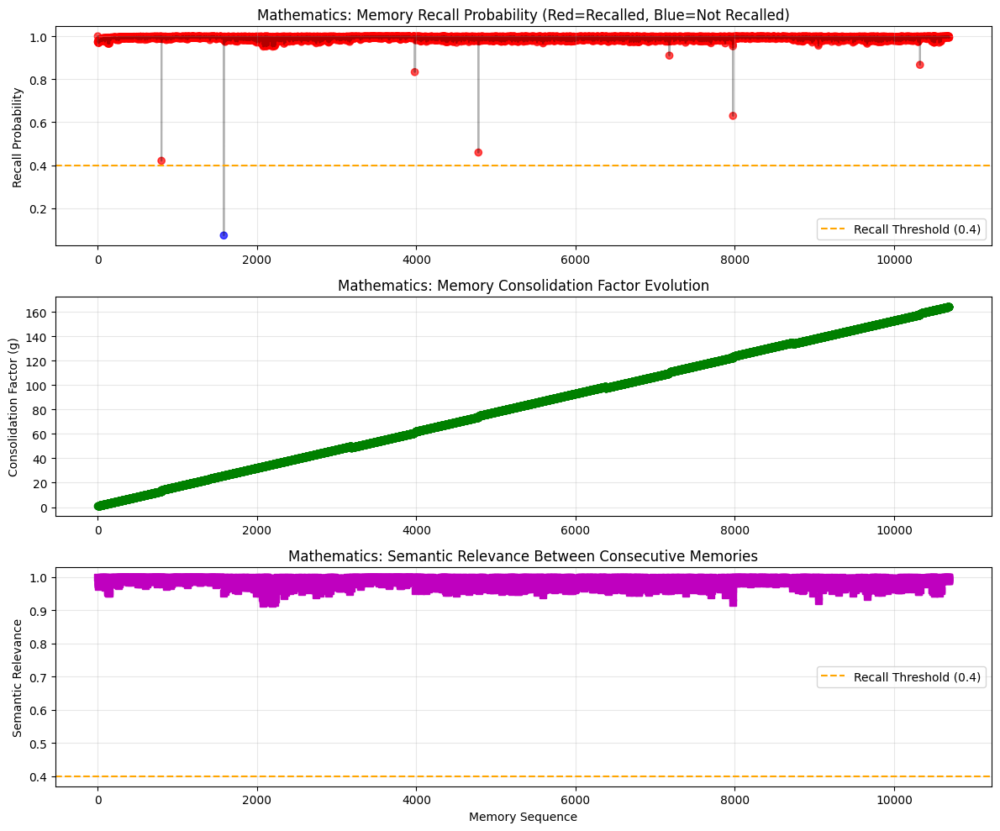


=== Mathematics Memory Analysis Summary ===
Total memories: 10691
Recall rate: 100.0%
Average relevance: 0.987
Average recall probability: 0.992
Consolidation growth: 163.423
Max consolidation factor: 164.423

Analysis complete! Check the plots for insights.

Key insights to look for:
1. Red points = memories that triggered recall
2. Rising consolidation = pattern learning
3. High relevance = similar physiological states


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from datetime import datetime
import math

class MemoryConsolidationSystem:
    def __init__(self, relevance_threshold=0.97):
        self.model = SentenceTransformer('all-MiniLM-L6-v2')
        self.relevance_threshold = relevance_threshold
        self.memories = []
        self.recall_probabilities = []
        self.consolidation_factors = []
        self.relevance_scores = []
        self.recall_events = []

    def calculate_semantic_relevance(self, text1, text2):
        """Calculate semantic relevance using sentence transformers"""
        vector1 = self.model.encode(text1)
        vector2 = self.model.encode(text2)

        # Cosine similarity
        dot_product = np.dot(vector1, vector2)
        norm1 = np.linalg.norm(vector1)
        norm2 = np.linalg.norm(vector2)

        relevance = dot_product / (norm1 * norm2)
        return max(0, relevance)  # Ensure non-negative

    def calculate_recall_probability(self, relevance, elapsed_time_seconds, consolidation_factor):
        """Calculate recall probability using paper's formula"""
        # Convert seconds to a small decimal for the formula
        t = elapsed_time_seconds / 100.0  # Scale down time to prevent probability = 0

        # Paper's formula: p_n(t) = [1 - exp(-r * e^(-t/g_n))] / [1 - e^(-1)]
        exponent = -relevance * math.exp(-t / consolidation_factor)
        numerator = 1 - math.exp(exponent)
        denominator = 1 - math.exp(-1)

        recall_prob = numerator / denominator
        return max(0, min(1, recall_prob))  # Ensure [0,1] range

    def update_consolidation_factor(self, previous_g, elapsed_time_seconds):
        """Update consolidation factor using paper's sigmoid function"""
        t = elapsed_time_seconds / 100.0  # Same scaling as recall probability

        # Modified sigmoid: S(t) = (1 - e^(-t)) / (1 + e^(-t))
        sigmoid_component = (1 - math.exp(-t)) / (1 + math.exp(-t))
        new_g = previous_g + sigmoid_component
        return new_g

    def process_memory_sequence(self, interpretation_data, subject_name):
        """Process a sequence of physiological interpretations as memories"""
        print(f"\n=== Processing {subject_name} Memory Sequence ===")

        # Reset for new subject
        self.memories = []
        self.recall_probabilities = []
        self.consolidation_factors = []
        self.relevance_scores = []
        self.recall_events = []

        for idx, row in interpretation_data.iterrows():
            interpretation_text = row['Physiological_Interpretation']
            time_str = row['Time']

            # Convert time to seconds since start
            time_parts = time_str.split(':')
            time_seconds = int(time_parts[0]) * 3600 + int(time_parts[1]) * 60 + int(time_parts[2])

            if len(self.memories) == 0:
                # First memory - initialize with defaults
                self.memories.append({
                    'text': interpretation_text,
                    'time': time_seconds,
                    'consolidation_factor': 1.0
                })
                self.recall_probabilities.append(1.0)  # Default high probability for first memory
                self.consolidation_factors.append(1.0)
                self.relevance_scores.append(1.0)
                self.recall_events.append(True)

                print(f"Memory 1: Initial memory stored (g=1.0)")

            else:
                # Calculate relevance with previous memory
                prev_memory = self.memories[-1]
                relevance = self.calculate_semantic_relevance(
                    interpretation_text,
                    prev_memory['text']
                )

                # Calculate elapsed time in seconds
                elapsed_time = time_seconds - prev_memory['time']

                # Calculate recall probability
                recall_prob = self.calculate_recall_probability(
                    relevance,
                    elapsed_time,
                    prev_memory['consolidation_factor']
                )

                # Check if memory should be recalled
                recalled = recall_prob > self.relevance_threshold

                # Update consolidation factor if recalled
                if recalled:
                    new_consolidation = self.update_consolidation_factor(
                        prev_memory['consolidation_factor'],
                        elapsed_time
                    )
                    print(f"Memory {len(self.memories)+1}: RECALLED (r={relevance:.3f}, p={recall_prob:.3f}, g={new_consolidation:.3f})")
                else:
                    new_consolidation = prev_memory['consolidation_factor']
                    print(f"Memory {len(self.memories)+1}: Not recalled (r={relevance:.3f}, p={recall_prob:.3f})")

                # Store new memory
                self.memories.append({
                    'text': interpretation_text,
                    'time': time_seconds,
                    'consolidation_factor': new_consolidation
                })

                # Store metrics
                self.recall_probabilities.append(recall_prob)
                self.consolidation_factors.append(new_consolidation)
                self.relevance_scores.append(relevance)
                self.recall_events.append(recalled)

        print(f"\nProcessed {len(self.memories)} memories")
        print(f"Recall events: {sum(self.recall_events)}/{len(self.recall_events)}")
        print(f"Final consolidation factor: {self.consolidation_factors[-1]:.3f}")

    def plot_memory_curves(self, subject_name):
        """Plot recall probability and consolidation factor curves"""
        if len(self.memories) < 2:
            print("Not enough memories to plot curves")
            return

        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 10))

        memory_indices = range(1, len(self.memories) + 1)

        # Plot 1: Recall Probability
        colors = ['red' if recalled else 'blue' for recalled in self.recall_events]
        ax1.scatter(memory_indices, self.recall_probabilities, c=colors, alpha=0.7)
        ax1.plot(memory_indices, self.recall_probabilities, 'k-', alpha=0.3)
        ax1.axhline(y=self.relevance_threshold, color='orange', linestyle='--',
                   label=f'Recall Threshold ({self.relevance_threshold})')
        ax1.set_ylabel('Recall Probability')
        ax1.set_title(f'{subject_name}: Memory Recall Probability (Red=Recalled, Blue=Not Recalled)')
        ax1.legend()
        ax1.grid(True, alpha=0.3)

        # Plot 2: Consolidation Factor
        ax2.plot(memory_indices, self.consolidation_factors, 'g-', linewidth=2, marker='o')
        ax2.set_ylabel('Consolidation Factor (g)')
        ax2.set_title(f'{subject_name}: Memory Consolidation Factor Evolution')
        ax2.grid(True, alpha=0.3)

        # Plot 3: Semantic Relevance
        ax3.plot(memory_indices, self.relevance_scores, 'm-', linewidth=2, marker='s')
        ax3.axhline(y=self.relevance_threshold, color='orange', linestyle='--',
                   label=f'Recall Threshold ({self.relevance_threshold})')
        ax3.set_ylabel('Semantic Relevance')
        ax3.set_xlabel('Memory Sequence')
        ax3.set_title(f'{subject_name}: Semantic Relevance Between Consecutive Memories')
        ax3.legend()
        ax3.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        # Print summary statistics
        print(f"\n=== {subject_name} Memory Analysis Summary ===")
        print(f"Total memories: {len(self.memories)}")
        print(f"Recall rate: {sum(self.recall_events)/len(self.recall_events)*100:.1f}%")
        print(f"Average relevance: {np.mean(self.relevance_scores):.3f}")
        print(f"Average recall probability: {np.mean(self.recall_probabilities):.3f}")
        print(f"Consolidation growth: {self.consolidation_factors[-1] - self.consolidation_factors[0]:.3f}")
        print(f"Max consolidation factor: {max(self.consolidation_factors):.3f}")

def process_subject_memory(csv_file_path, subject_name):
    """Process a single subject's memory consolidation"""

    # Load the CSV with interpretations
    try:
        df = pd.read_csv(csv_file_path)
        print(f"Loaded {len(df)} records from {csv_file_path}")

        # Check if interpretations column exists
        if 'Physiological_Interpretation' not in df.columns:
            print("Error: 'Physiological_Interpretation' column not found")
            print("Available columns:", df.columns.tolist())
            return

        # Initialize memory system
        memory_system = MemoryConsolidationSystem(relevance_threshold=0.4)

        # Process the memory sequence
        memory_system.process_memory_sequence(df, subject_name)

        # Plot the results
        memory_system.plot_memory_curves(subject_name)

        return memory_system

    except Exception as e:
        print(f"Error processing {csv_file_path}: {e}")
        return None

# Example usage
if __name__ == "__main__":
    # Example: Process Mathematics subject for Student 2
    csv_path = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features/fourth/Maths_features_with_interpretations.csv"
    subject = "Mathematics"

    print("Human-like Memory Consolidation Analysis")
    print("=" * 50)

    memory_system = process_subject_memory(csv_path, subject)

    if memory_system:
        print("\nAnalysis complete! Check the plots for insights.")
        print("\nKey insights to look for:")
        print("1. Red points = memories that triggered recall")
        print("2. Rising consolidation = pattern learning")
        print("3. High relevance = similar physiological states")

Next type of interpretation

In [ ]:
import pandas as pd
import numpy as np
import random
from datetime import datetime
import os
from typing import Dict, List, Tuple, Optional

class EnhancedPhysiologicalInterpreter:
    def __init__(self):
        # Keep original thresholds (proven to work well)
        self.hr_thresholds = {
            'very_low': (0, 60), 'low': (60, 70), 'normal': (70, 85),
            'elevated': (85, 100), 'high': (100, 120), 'very_high': (120, 200)
        }

        self.hr_variability_thresholds = {
            'very_stable': (0, 2), 'stable': (2, 5), 'moderate': (5, 15),
            'variable': (15, 25), 'highly_variable': (25, 100)
        }

        self.eda_thresholds = {
            'very_low': (0, 0.05), 'low': (0.05, 0.1), 'moderate': (0.1, 0.2),
            'elevated': (0.2, 0.5), 'high': (0.5, 1.0), 'very_high': (1.0, 10)
        }

        self.activity_thresholds = {
            'minimal': (0, 0.1), 'low': (0.1, 0.3), 'moderate': (0.3, 0.6),
            'active': (0.6, 0.8), 'highly_active': (0.8, 1.0)
        }

        self.stress_index_thresholds = {
            'very_relaxed': (0, 1), 'relaxed': (1, 2), 'balanced': (2, 4),
            'stressed': (4, 6), 'highly_stressed': (6, 20)
        }

        # NEW: Diversification components
        self.vocabulary_sets = {
            'hr_descriptors': {
                'very_low': ['exceptionally low', 'remarkably low', 'unusually reduced', 'significantly decreased'],
                'low': ['low resting', 'reduced', 'calm baseline', 'subdued cardiac'],
                'normal': ['healthy', 'optimal', 'balanced', 'steady', 'regular'],
                'elevated': ['moderately elevated', 'increased', 'raised', 'heightened', 'amplified'],
                'high': ['elevated', 'high', 'intensified', 'pronounced', 'substantial'],
                'very_high': ['significantly elevated', 'markedly high', 'extremely elevated', 'critically high']
            },
            'variability_descriptors': {
                'very_stable': ['excellent cardiac stability', 'outstanding rhythmic consistency', 'remarkable cardiac steadiness'],
                'stable': ['good cardiac stability', 'consistent rhythm patterns', 'reliable heart rate control'],
                'moderate': ['moderate heart rate fluctuation', 'balanced variability', 'controlled cardiac changes'],
                'variable': ['notable heart rate variability', 'dynamic cardiac patterns', 'active rhythm fluctuation'],
                'highly_variable': ['high cardiac variability', 'significant rhythm instability', 'pronounced cardiac fluctuation']
            },
            'eda_descriptors': {
                'very_low': ['minimal arousal', 'negligible activation', 'extremely low responsiveness'],
                'low': ['calm, low arousal state', 'subdued emotional activity', 'peaceful activation levels'],
                'moderate': ['moderate emotional engagement', 'balanced arousal patterns', 'appropriate stress response'],
                'elevated': ['heightened arousal', 'increased emotional activation', 'enhanced stress responsiveness'],
                'high': ['high stress or excitement', 'intense emotional arousal', 'significant physiological activation'],
                'very_high': ['intense physiological arousal', 'extreme stress response', 'overwhelming activation']
            },
            'engagement_terms': {
                'high': ['deeply focused', 'actively engaged', 'intensely concentrated', 'fully immersed', 'completely absorbed'],
                'moderate': ['moderately engaged', 'attentively participating', 'reasonably focused', 'adequately involved'],
                'low': ['minimally engaged', 'passively present', 'somewhat distracted', 'partially focused'],
                'disengaged': ['disengaged', 'detached', 'withdrawn', 'unfocused', 'mentally absent']
            }
        }

        # NEW: Interpretation frameworks for semantic variety
        self.interpretation_styles = {
            'clinical': {
                'intro_templates': [
                    "Physiological monitoring during {} class reveals",
                    "Biomarker analysis throughout {} session indicates",
                    "Cardiovascular and autonomic measures during {} show"
                ],
                'connectors': ['furthermore', 'additionally', 'concurrently', 'simultaneously'],
                'conclusions': [
                    "These physiological indicators suggest {} learning engagement",
                    "The biomarker profile reflects {} academic involvement",
                    "Combined measures point to {} classroom participation"
                ]
            },
            'educational': {
                'intro_templates': [
                    "During this {} learning period, the student exhibited",
                    "Throughout the {} session, physiological patterns suggested",
                    "The {} class period showed student responses indicating"
                ],
                'connectors': ['while', 'as', 'during which', 'throughout this period'],
                'conclusions': [
                    "Overall, these patterns indicate {} engagement with the material",
                    "The combined evidence suggests {} learning involvement",
                    "These responses reflect {} educational participation"
                ]
            },
            'narrative': {
                'intro_templates': [
                    "The student's body told a story of {} during {} class",
                    "Physiological rhythms painted a picture of {} throughout {}",
                    "The biological narrative during {} revealed patterns of {}"
                ],
                'connectors': ['meanwhile', 'as this unfolded', 'simultaneously', 'in parallel'],
                'conclusions': [
                    "This physiological story suggests {} with the learning experience",
                    "The body's narrative indicates {} educational engagement",
                    "These biological chapters reveal {} academic involvement"
                ]
            },
            'analytical': {
                'intro_templates': [
                    "Systematic analysis of {} class physiological data demonstrates",
                    "Quantitative assessment during {} reveals patterns suggesting",
                    "Data-driven interpretation of {} session indicates"
                ],
                'connectors': ['correlating with', 'in conjunction with', 'paired with', 'combined with'],
                'conclusions': [
                    "Analytical synthesis indicates {} learning engagement",
                    "Quantitative evidence points to {} academic participation",
                    "Data convergence suggests {} educational involvement"
                ]
            }
        }

        # NEW: Subject-specific context integration
        self.subject_contexts = {
            'Mathematics': {
                'cognitive_load': 'analytical problem-solving demands',
                'typical_responses': 'concentrated cognitive processing',
                'engagement_markers': 'sustained mathematical reasoning'
            },
            'Assembly': {
                'cognitive_load': 'social listening and community awareness',
                'typical_responses': 'variable attention with social engagement',
                'engagement_markers': 'collective participation patterns'
            },
            'English': {
                'cognitive_load': 'linguistic comprehension and expression',
                'typical_responses': 'creative and analytical thinking',
                'engagement_markers': 'literary engagement and discussion'
            },
            'Science': {
                'cognitive_load': 'scientific observation and hypothesis formation',
                'typical_responses': 'curiosity-driven exploration',
                'engagement_markers': 'investigative engagement patterns'
            },
            'PE': {
                'cognitive_load': 'motor coordination and physical exertion',
                'typical_responses': 'elevated physical activation',
                'engagement_markers': 'kinesthetic participation indicators'
            }
        }

    def categorize_value(self, value, thresholds):
        """Categorize a value based on threshold ranges"""
        if pd.isna(value):
            return 'unknown'
        for category, (min_val, max_val) in thresholds.items():
            if min_val <= value < max_val:
                return category
        return 'extreme'

    def get_random_descriptor(self, category: str, subcategory: str) -> str:
        """Get random descriptor to increase vocabulary diversity"""
        if category in self.vocabulary_sets and subcategory in self.vocabulary_sets[category]:
            return random.choice(self.vocabulary_sets[category][subcategory])
        return subcategory

    def interpret_heart_rate_diverse(self, mean_hr, hr_std, hr_range, style='clinical'):
        """Generate diverse heart rate interpretations"""
        if pd.isna(mean_hr):
            return random.choice([
                "Heart rate data was not captured during this period",
                "Cardiac monitoring was unavailable for this timeframe",
                "Heart rate measurements were not recorded"
            ])

        hr_category = self.categorize_value(mean_hr, self.hr_thresholds)
        variability_category = self.categorize_value(hr_std, self.hr_variability_thresholds)

        hr_descriptor = self.get_random_descriptor('hr_descriptors', hr_category)
        variability_descriptor = self.get_random_descriptor('variability_descriptors', variability_category)

        # Different interpretation angles
        interpretation_angles = [
            f"Cardiac activity at {mean_hr:.1f} bpm demonstrates {hr_descriptor} patterns with {variability_descriptor}",
            f"Heart rate monitoring reveals {hr_descriptor} rhythm ({mean_hr:.1f} bpm) characterized by {variability_descriptor}",
            f"The {hr_descriptor} heart rate of {mean_hr:.1f} bpm, combined with {variability_descriptor}, suggests",
            f"Cardiovascular analysis shows {hr_descriptor} activity at {mean_hr:.1f} bpm with {variability_descriptor}"
        ]

        # Context-dependent conclusions
        if hr_category in ['normal'] and variability_category in ['stable', 'moderate']:
            conclusions = ['optimal physiological engagement', 'balanced cognitive activation', 'healthy learning arousal']
        elif hr_category in ['elevated', 'high']:
            conclusions = ['heightened cognitive engagement', 'increased learning activation', 'elevated task involvement']
        else:
            conclusions = ['unique physiological response', 'individualized activation pattern', 'distinctive engagement signature']

        base = random.choice(interpretation_angles)
        conclusion = random.choice(conclusions)

        return f"{base} {conclusion}."

    def interpret_eda_diverse(self, mean_eda, peak_count, slope, response_recovery, style='clinical'):
        """Generate diverse EDA interpretations"""
        if pd.isna(mean_eda):
            return random.choice([
                "Electrodermal activity was not monitored during this segment",
                "Stress response data was unavailable for this period",
                "Autonomic arousal measurements were not captured"
            ])

        eda_category = self.categorize_value(mean_eda, self.eda_thresholds)
        eda_descriptor = self.get_random_descriptor('eda_descriptors', eda_category)

        # Peak interpretation with variety
        peak_interpretations = []
        if pd.notna(peak_count):
            if peak_count == 0:
                peak_interpretations = ["sustained emotional stability", "absence of stress responses", "calm autonomic regulation"]
            elif peak_count <= 2:
                peak_interpretations = [f"{int(peak_count)} minor arousal events", f"{int(peak_count)} controlled stress responses", f"{int(peak_count)} brief activation episodes"]
            else:
                peak_interpretations = [f"{int(peak_count)} activation peaks", f"{int(peak_count)} stress response events", f"{int(peak_count)} arousal fluctuations"]

        # Varied sentence structures
        structures = [
            f"Electrodermal activity at {mean_eda:.3f} μS indicates {eda_descriptor}",
            f"Stress response patterns show {eda_descriptor} with readings of {mean_eda:.3f} μS",
            f"Autonomic arousal demonstrates {eda_descriptor} ({mean_eda:.3f} μS)",
            f"Skin conductance analysis reveals {eda_descriptor} at {mean_eda:.3f} μS"
        ]

        base = random.choice(structures)
        if peak_interpretations:
            peak_desc = random.choice(peak_interpretations)
            return f"{base} featuring {peak_desc}."
        else:
            return f"{base}."

    def interpret_movement_diverse(self, movement_var, activity_ratio, stillness_periods, fidgeting_index, style='clinical'):
        """Generate diverse movement interpretations"""
        if pd.isna(activity_ratio):
            return random.choice([
                "Movement data was not available for this timeframe",
                "Physical activity monitoring was interrupted",
                "Kinesthetic measurements were not recorded"
            ])

        activity_category = self.categorize_value(activity_ratio, self.activity_thresholds)

        # Diverse activity descriptions
        activity_descriptions = {
            'minimal': ['extremely limited movement', 'nearly motionless behavior', 'exceptional physical stillness'],
            'low': ['restrained physical activity', 'controlled movement patterns', 'subdued kinesthetic expression'],
            'moderate': ['balanced physical engagement', 'appropriate activity levels', 'measured movement responses'],
            'active': ['elevated physical activity', 'dynamic movement patterns', 'engaged kinesthetic behavior'],
            'highly_active': ['continuous physical motion', 'constant movement activity', 'persistent kinesthetic engagement']
        }

        descriptions = activity_descriptions.get(activity_category, ['unusual movement patterns'])
        activity_desc = random.choice(descriptions)

        # Different analytical perspectives
        perspectives = [
            f"Physical behavior analysis reveals {activity_desc} (activity ratio: {activity_ratio:.2f})",
            f"Movement patterns demonstrate {activity_desc} with a {activity_ratio:.2f} activity coefficient",
            f"Kinesthetic monitoring shows {activity_desc}, quantified at {activity_ratio:.2f}",
            f"Body movement assessment indicates {activity_desc} (measured at {activity_ratio:.2f})"
        ]

        return random.choice(perspectives) + "."

    def interpret_comprehensive_diverse(self, row_data, time_str, subject, participant_name="Student"):
        """Generate comprehensive diverse interpretation"""

        # Select random interpretation style
        style = random.choice(list(self.interpretation_styles.keys()))
        style_data = self.interpretation_styles[style]

        # Parse time with varied descriptions
        try:
            time_obj = datetime.strptime(time_str, '%H:%M:%S')
            time_descriptors = {
                'early_morning': ['early morning', 'dawn session', 'morning commencement'],
                'late_morning': ['late morning', 'mid-morning period', 'morning progression'],
                'early_afternoon': ['early afternoon', 'post-lunch session', 'afternoon initiation'],
                'afternoon': ['afternoon', 'late day period', 'evening approach']
            }

            if time_obj.hour < 10:
                time_period = random.choice(time_descriptors['early_morning'])
            elif time_obj.hour < 12:
                time_period = random.choice(time_descriptors['late_morning'])
            elif time_obj.hour < 14:
                time_period = random.choice(time_descriptors['early_afternoon'])
            else:
                time_period = random.choice(time_descriptors['afternoon'])
        except:
            time_period = "during this session"

        # Generate diverse component interpretations
        hr_interp = self.interpret_heart_rate_diverse(
            row_data.get('Mean_HR'), row_data.get('HR_Std'),
            row_data.get('HR_Range'), style
        )

        eda_interp = self.interpret_eda_diverse(
            row_data.get('Mean_EDA'), row_data.get('EDA_Peak_Count'),
            row_data.get('EDA_Slope'), row_data.get('EDA_Response_Recovery'), style
        )

        movement_interp = self.interpret_movement_diverse(
            row_data.get('Movement_Magnitude_Var'), row_data.get('Activity_Ratio'),
            row_data.get('Stillness_Periods'), row_data.get('Fidgeting_Index'), style
        )

        # Determine engagement with varied terminology
        engagement_level = self.determine_diverse_engagement(row_data)

        # Construct interpretation with selected style
        intro_template = random.choice(style_data['intro_templates'])
        if style == 'narrative':
            intro = intro_template.format(engagement_level, subject)
        else:
            intro = intro_template.format(subject)

        connector = random.choice(style_data['connectors'])
        conclusion_template = random.choice(style_data['conclusions'])
        conclusion = conclusion_template.format(engagement_level)

        # Varied sentence structures
        structures = [
            f"{intro} {hr_interp} {connector.capitalize()}, {eda_interp.lower()} {movement_interp} {conclusion}.",
            f"{intro}: {hr_interp} This occurred {connector} {eda_interp.lower()}, while {movement_interp.lower()} {conclusion}.",
            f"{hr_interp} During {subject} ({time_period}), {eda_interp.lower()} {connector} {movement_interp.lower()} {conclusion}.",
            f"Analysis of {participant_name} during {subject} shows: {hr_interp} {eda_interp} {movement_interp} {conclusion}."
        ]

        return random.choice(structures)

    def determine_diverse_engagement(self, row_data):
        """Determine engagement level with diverse terminology"""
        engagement_scores = []

        # Calculate scores (keeping original logic)
        if pd.notna(row_data.get('Mean_HR')):
            hr = row_data['Mean_HR']
            if 70 <= hr <= 85:
                engagement_scores.append(3)
            elif 85 < hr <= 100:
                engagement_scores.append(4)
            elif 60 <= hr < 70:
                engagement_scores.append(2)
            else:
                engagement_scores.append(1)

        if pd.notna(row_data.get('Mean_EDA')):
            eda = row_data['Mean_EDA']
            if 0.1 <= eda <= 0.2:
                engagement_scores.append(3)
            elif 0.05 <= eda < 0.1:
                engagement_scores.append(2)
            elif eda > 0.2:
                engagement_scores.append(4)
            else:
                engagement_scores.append(1)

        if pd.notna(row_data.get('Activity_Ratio')):
            activity = row_data['Activity_Ratio']
            if 0.3 <= activity <= 0.6:
                engagement_scores.append(3)
            elif 0.1 <= activity < 0.3:
                engagement_scores.append(2)
            elif activity > 0.6:
                engagement_scores.append(4)
            else:
                engagement_scores.append(1)

        if engagement_scores:
            avg_score = np.mean(engagement_scores)
            if avg_score >= 3.5:
                return random.choice(self.vocabulary_sets['engagement_terms']['high'])
            elif avg_score >= 2.5:
                return random.choice(self.vocabulary_sets['engagement_terms']['moderate'])
            elif avg_score >= 1.5:
                return random.choice(self.vocabulary_sets['engagement_terms']['low'])
            else:
                return random.choice(self.vocabulary_sets['engagement_terms']['disengaged'])
        else:
            return "showing unclear engagement patterns"

    def process_csv_with_diversity(self, csv_path, subject_name, participant_name="Student"):
        """Process CSV file with semantic diversity enhancement"""
        try:
            df = pd.read_csv(csv_path)
            interpretations = []

            for index, row in df.iterrows():
                time_str = row.get('Time', f'Row_{index}')
                interpretation = self.interpret_comprehensive_diverse(
                    row, str(time_str), subject_name, participant_name
                )
                interpretations.append(interpretation)

            df['Physiological_Interpretation'] = interpretations

            # Save enhanced file with diversity marker
            base_name = os.path.splitext(csv_path)[0]
            output_path = f"{base_name}_diverse_interpretations.csv"
            df.to_csv(output_path, index=False)

            print(f"Diverse interpretations saved: {output_path}")
            print(f"Generated {len(interpretations)} semantically diverse interpretations")

            return output_path

        except Exception as e:
            print(f"Error processing {csv_path}: {e}")
            return None

    def process_all_files_diverse(self, base_directory):
        """Process all files with diversity enhancement"""
        processed_files = []

        # Participant folder mapping
        participant_names = {
            'first': 'Student 1', 'second': 'Student 2', 'third': 'Student 3',
            'fourth': 'Student 4', 'fifth': 'Student 5', 'sixth': 'Student 6',
            'seventh': 'Student 7', 'eighth': 'Student 8', 'ninth': 'Student 9',
            'tenth': 'Student 10'
        }

        # Iterate through participant folders
        for participant_folder in os.listdir(base_directory):
            participant_path = os.path.join(base_directory, participant_folder)

            # Skip if not a directory
            if not os.path.isdir(participant_path):
                continue

            participant_name = participant_names.get(participant_folder, "Student")
            print(f"\n📁 Processing participant: {participant_name} ({participant_folder})")

            # Process all CSV files in this participant's folder
            for file in os.listdir(participant_path):
                if file.endswith('_features_with_estimates.csv') and 'diverse_interpretations' not in file:
                    csv_path = os.path.join(participant_path, file)

                    # Extract subject name from filename
                    # e.g., "Chapel_features_with_estimates.csv" -> "Chapel"
                    subject_name = file.replace('_features_with_estimates.csv', '')

                    print(f"  📄 Processing: {subject_name}")

                    output_file = self.process_csv_with_diversity(csv_path, subject_name, participant_name)
                    if output_file:
                        processed_files.append(output_file)
                        print(f"    ✅ Generated: {os.path.basename(output_file)}")

        print(f"\n🎉 Successfully processed {len(processed_files)} files with semantic diversity")
        print(f"📊 Participants: {len([f for f in os.listdir(base_directory) if os.path.isdir(os.path.join(base_directory, f))])}")
        return processed_files

    def validate_interpretation_diversity(self, csv_path):
        """Validate the semantic diversity of generated interpretations"""
        try:
            df = pd.read_csv(csv_path)
            interpretations = df['Physiological_Interpretation'].tolist()

            # Basic diversity metrics
            total_words = ' '.join(interpretations).split()
            unique_words = set(total_words)

            # Length variability
            lengths = [len(interp.split()) for interp in interpretations]

            # Sentence structure variability
            sentence_starts = [interp.split()[0] for interp in interpretations if interp.split()]
            unique_starts = set(sentence_starts)

            diversity_metrics = {
                'total_interpretations': len(interpretations),
                'avg_length': np.mean(lengths),
                'length_std': np.std(lengths),
                'vocabulary_richness': len(unique_words) / len(total_words),
                'start_diversity': len(unique_starts) / len(sentence_starts),
                'sample_interpretations': interpretations[:3]
            }

            print("\n📊 Diversity Validation Results:")
            print(f"Total interpretations: {diversity_metrics['total_interpretations']}")
            print(f"Average length: {diversity_metrics['avg_length']:.1f} words")
            print(f"Length variability (std): {diversity_metrics['length_std']:.1f}")
            print(f"Vocabulary richness: {diversity_metrics['vocabulary_richness']:.3f}")
            print(f"Sentence start diversity: {diversity_metrics['start_diversity']:.3f}")

            return diversity_metrics

        except Exception as e:
            print(f"Error validating diversity: {e}")
            return None

# Example usage
if __name__ == "__main__":
    # Initialize enhanced interpreter
    interpreter = EnhancedPhysiologicalInterpreter()

    # Process single file for testing
    # interpreter.process_csv_with_diversity("path/to/Mathematics_features.csv", "Mathematics", "Student 8")

    # Process all files with diversity
    base_directory = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features"
    processed_files = interpreter.process_all_files_diverse(base_directory)

    # Validate diversity for first processed file
    if processed_files:
        interpreter.validate_interpretation_diversity(processed_files[0])


📁 Processing participant: Student 1 (first)

📁 Processing participant: Student 2 (second)
  📄 Processing: Assembly
Diverse interpretations saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Assembly_features_with_estimates_diverse_interpretations.csv
Generated 1146 semantically diverse interpretations
    ✅ Generated: Assembly_features_with_estimates_diverse_interpretations.csv
  📄 Processing: Form
Diverse interpretations saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/Form_features_with_estimates_diverse_interpretations.csv
Generated 1598 semantically diverse interpretations
    ✅ Generated: Form_features_with_estimates_diverse_interpretations.csv
  📄 Processing: English
Diverse interpretations saved: /content/drive/MyDrive/SegregatedParticipants/Physiological_Features/second/English_features_with_estimates_diverse_interpretations.csv
Generated 10620 semantically diverse interpretations
    ✅ Generated: English_featur

🧠 Human-like Memory Consolidation Analysis
📁 Loaded 10691 records from Maths_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Mathematics Memory Sequence


Processing memories: 100%|██████████| 10691/10691 [18:32<00:00,  9.61memory/s]


✅ Processed 10691 memories
📊 Recall rate: 55.1% | Avg relevance: 0.794 | Final consolidation: 86.563
💾 Memory data saved to: memory_results/Maths_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: memory_results/Maths_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

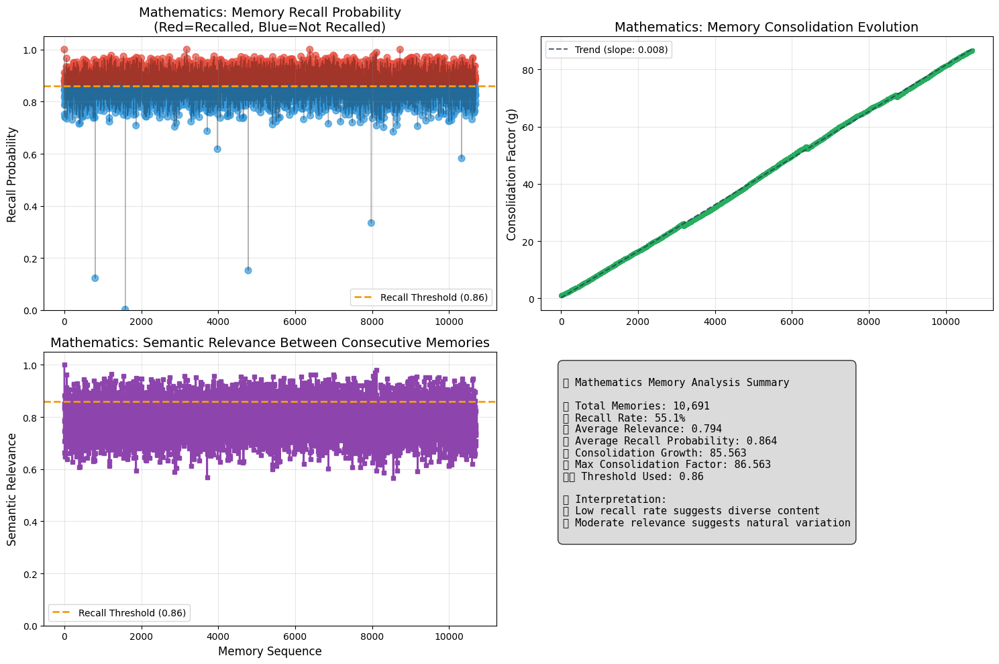


✅ Analysis complete!

🔍 Key insights to look for:
• Red points = memories that triggered recall
• Rising consolidation = pattern learning
• High relevance = similar physiological states
• Check CSV file for detailed memory data

📊 Quick Summary:
   Recall Rate: 55.1%
   Avg Relevance: 0.794
   Consolidation Growth: 85.563


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from datetime import datetime
import math
import os
from tqdm import tqdm

class MemoryConsolidationSystem:
    def __init__(self, relevance_threshold=0.97):
        self.model = SentenceTransformer('all-MiniLM-L6-v2')
        self.relevance_threshold = relevance_threshold
        self.memories = []
        self.memory_data = []  # Store all data for CSV export

    def calculate_semantic_relevance(self, text1, text2):
        """Calculate semantic relevance using sentence transformers"""
        vector1 = self.model.encode(text1)
        vector2 = self.model.encode(text2)

        # Cosine similarity
        dot_product = np.dot(vector1, vector2)
        norm1 = np.linalg.norm(vector1)
        norm2 = np.linalg.norm(vector2)

        relevance = dot_product / (norm1 * norm2)
        return max(0, relevance)  # Ensure non-negative

    def calculate_recall_probability(self, relevance, elapsed_time_seconds, consolidation_factor):
        """Calculate recall probability using paper's formula"""
        # Convert seconds to a small decimal for the formula
        t = elapsed_time_seconds / 100.0  # Scale down time to prevent probability = 0

        # Paper's formula: p_n(t) = [1 - exp(-r * e^(-t/g_n))] / [1 - e^(-1)]
        exponent = -relevance * math.exp(-t / consolidation_factor)
        numerator = 1 - math.exp(exponent)
        denominator = 1 - math.exp(-1)

        recall_prob = numerator / denominator
        return max(0, min(1, recall_prob))  # Ensure [0,1] range

    def update_consolidation_factor(self, previous_g, elapsed_time_seconds):
        """Update consolidation factor using paper's sigmoid function"""
        t = elapsed_time_seconds / 100.0  # Same scaling as recall probability

        # Modified sigmoid: S(t) = (1 - e^(-t)) / (1 + e^(-t))
        sigmoid_component = (1 - math.exp(-t)) / (1 + math.exp(-t))
        new_g = previous_g + sigmoid_component
        return new_g

    def process_memory_sequence(self, interpretation_data, subject_name):
        """Process a sequence of physiological interpretations as memories"""
        print(f"\n🧠 Processing {subject_name} Memory Sequence")

        # Reset for new subject
        self.memories = []
        self.memory_data = []

        # Progress bar for processing memories
        for idx, row in tqdm(interpretation_data.iterrows(),
                           total=len(interpretation_data),
                           desc="Processing memories",
                           unit="memory"):

            interpretation_text = row['Physiological_Interpretation']
            time_str = row['Time']

            # Convert time to seconds since start
            time_parts = time_str.split(':')
            time_seconds = int(time_parts[0]) * 3600 + int(time_parts[1]) * 60 + int(time_parts[2])

            if len(self.memories) == 0:
                # First memory - initialize with defaults
                memory_record = {
                    'Memory_Index': 1,
                    'Time': time_str,
                    'Time_Seconds': time_seconds,
                    'Interpretation': interpretation_text,
                    'Semantic_Relevance': 1.0,  # First memory baseline
                    'Elapsed_Time_Seconds': 0,
                    'Recall_Probability': 1.0,
                    'Consolidation_Factor': 1.0,
                    'Recalled': True,
                    'Previous_Memory_Index': None
                }

                self.memories.append({
                    'text': interpretation_text,
                    'time': time_seconds,
                    'consolidation_factor': 1.0
                })

                self.memory_data.append(memory_record)

            else:
                # Calculate relevance with previous memory
                prev_memory = self.memories[-1]
                relevance = self.calculate_semantic_relevance(
                    interpretation_text,
                    prev_memory['text']
                )

                # Calculate elapsed time in seconds
                elapsed_time = time_seconds - prev_memory['time']

                # Calculate recall probability
                recall_prob = self.calculate_recall_probability(
                    relevance,
                    elapsed_time,
                    prev_memory['consolidation_factor']
                )

                # Check if memory should be recalled
                recalled = recall_prob > self.relevance_threshold

                # Update consolidation factor if recalled
                if recalled:
                    new_consolidation = self.update_consolidation_factor(
                        prev_memory['consolidation_factor'],
                        elapsed_time
                    )
                else:
                    new_consolidation = prev_memory['consolidation_factor']

                # Create memory record
                memory_record = {
                    'Memory_Index': len(self.memories) + 1,
                    'Time': time_str,
                    'Time_Seconds': time_seconds,
                    'Interpretation': interpretation_text,
                    'Semantic_Relevance': relevance,
                    'Elapsed_Time_Seconds': elapsed_time,
                    'Recall_Probability': recall_prob,
                    'Consolidation_Factor': new_consolidation,
                    'Recalled': recalled,
                    'Previous_Memory_Index': len(self.memories)
                }

                # Store new memory
                self.memories.append({
                    'text': interpretation_text,
                    'time': time_seconds,
                    'consolidation_factor': new_consolidation
                })

                self.memory_data.append(memory_record)

        # Print summary
        recall_rate = sum(1 for record in self.memory_data if record['Recalled']) / len(self.memory_data) * 100
        avg_relevance = np.mean([record['Semantic_Relevance'] for record in self.memory_data])
        final_consolidation = self.memory_data[-1]['Consolidation_Factor']

        print(f"✅ Processed {len(self.memories)} memories")
        print(f"📊 Recall rate: {recall_rate:.1f}% | Avg relevance: {avg_relevance:.3f} | Final consolidation: {final_consolidation:.3f}")

    def save_to_csv(self, output_path, subject_name):
        """Save memory consolidation results to CSV"""
        df = pd.DataFrame(self.memory_data)

        # Add subject information
        df['Subject'] = subject_name
        df['Threshold_Used'] = self.relevance_threshold

        # Reorder columns for better readability
        column_order = [
            'Memory_Index', 'Subject', 'Time', 'Time_Seconds',
            'Semantic_Relevance', 'Recall_Probability', 'Consolidation_Factor',
            'Recalled', 'Elapsed_Time_Seconds', 'Previous_Memory_Index',
            'Threshold_Used', 'Interpretation'
        ]

        df = df[column_order]
        df.to_csv(output_path, index=False)

        print(f"💾 Memory data saved to: {output_path}")
        return output_path

    def create_visualization(self, subject_name, save_path=None):
        """Create comprehensive visualization of memory consolidation"""
        if len(self.memory_data) < 2:
            print("❌ Not enough memories to create visualization")
            return

        # Extract data for plotting
        memory_indices = [record['Memory_Index'] for record in self.memory_data]
        recall_probabilities = [record['Recall_Probability'] for record in self.memory_data]
        consolidation_factors = [record['Consolidation_Factor'] for record in self.memory_data]
        relevance_scores = [record['Semantic_Relevance'] for record in self.memory_data]
        recall_events = [record['Recalled'] for record in self.memory_data]

        # Create the visualization
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

        # Plot 1: Recall Probability with threshold
        colors = ['#e74c3c' if recalled else '#3498db' for recalled in recall_events]
        ax1.scatter(memory_indices, recall_probabilities, c=colors, alpha=0.7, s=50)
        ax1.plot(memory_indices, recall_probabilities, 'k-', alpha=0.3, linewidth=1)
        ax1.axhline(y=self.relevance_threshold, color='#f39c12', linestyle='--', linewidth=2,
                   label=f'Recall Threshold ({self.relevance_threshold})')
        ax1.set_ylabel('Recall Probability', fontsize=12)
        ax1.set_title(f'{subject_name}: Memory Recall Probability\n(Red=Recalled, Blue=Not Recalled)', fontsize=14)
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        ax1.set_ylim(0, 1.05)

        # Plot 2: Consolidation Factor Growth
        ax2.plot(memory_indices, consolidation_factors, '#27ae60', linewidth=3, marker='o', markersize=4)
        ax2.set_ylabel('Consolidation Factor (g)', fontsize=12)
        ax2.set_title(f'{subject_name}: Memory Consolidation Evolution', fontsize=14)
        ax2.grid(True, alpha=0.3)

        # Add trend line
        z = np.polyfit(memory_indices, consolidation_factors, 1)
        p = np.poly1d(z)
        ax2.plot(memory_indices, p(memory_indices), '--', color='#2c3e50', alpha=0.8,
                label=f'Trend (slope: {z[0]:.3f})')
        ax2.legend()

        # Plot 3: Semantic Relevance Distribution
        ax3.plot(memory_indices, relevance_scores, '#8e44ad', linewidth=2, marker='s', markersize=4)
        ax3.axhline(y=self.relevance_threshold, color='#f39c12', linestyle='--', linewidth=2,
                   label=f'Recall Threshold ({self.relevance_threshold})')
        ax3.set_ylabel('Semantic Relevance', fontsize=12)
        ax3.set_xlabel('Memory Sequence', fontsize=12)
        ax3.set_title(f'{subject_name}: Semantic Relevance Between Consecutive Memories', fontsize=14)
        ax3.legend()
        ax3.grid(True, alpha=0.3)
        ax3.set_ylim(0, 1.05)

        # Plot 4: Summary Statistics
        ax4.axis('off')

        # Calculate statistics
        total_memories = len(memory_indices)
        recall_rate = sum(recall_events) / len(recall_events) * 100
        avg_relevance = np.mean(relevance_scores)
        avg_recall_prob = np.mean(recall_probabilities)
        consolidation_growth = consolidation_factors[-1] - consolidation_factors[0]
        max_consolidation = max(consolidation_factors)

        # Create summary text
        summary_text = f"""
📊 {subject_name} Memory Analysis Summary

🧠 Total Memories: {total_memories:,}
🎯 Recall Rate: {recall_rate:.1f}%
🔗 Average Relevance: {avg_relevance:.3f}
📈 Average Recall Probability: {avg_recall_prob:.3f}
📊 Consolidation Growth: {consolidation_growth:.3f}
🔝 Max Consolidation Factor: {max_consolidation:.3f}
🎚️ Threshold Used: {self.relevance_threshold}

🔍 Interpretation:
{'✅ High recall rate suggests similar content' if recall_rate > 70 else '❌ Low recall rate suggests diverse content'}
{'🔴 Very high relevance indicates template-like text' if avg_relevance > 0.9 else '🟢 Moderate relevance suggests natural variation'}
        """

        ax4.text(0.05, 0.95, summary_text, transform=ax4.transAxes, fontsize=11,
                verticalalignment='top', fontfamily='monospace',
                bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgray', alpha=0.8))

        plt.tight_layout()

        # Save if path provided
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"📊 Visualization saved to: {save_path}")

        plt.show()

    def get_summary_stats(self):
        """Get summary statistics as dictionary"""
        if not self.memory_data:
            return {}

        recall_events = [record['Recalled'] for record in self.memory_data]
        relevance_scores = [record['Semantic_Relevance'] for record in self.memory_data]
        recall_probabilities = [record['Recall_Probability'] for record in self.memory_data]
        consolidation_factors = [record['Consolidation_Factor'] for record in self.memory_data]

        return {
            'total_memories': len(self.memory_data),
            'recall_rate': sum(recall_events) / len(recall_events) * 100,
            'avg_relevance': np.mean(relevance_scores),
            'avg_recall_probability': np.mean(recall_probabilities),
            'consolidation_growth': consolidation_factors[-1] - consolidation_factors[0],
            'max_consolidation_factor': max(consolidation_factors),
            'threshold_used': self.relevance_threshold
        }

def process_subject_memory_enhanced(csv_file_path, subject_name, output_dir="memory_results"):
    """Process a single subject's memory consolidation with enhanced features"""

    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    try:
        # Load the CSV with interpretations
        df = pd.read_csv(csv_file_path)
        print(f"📁 Loaded {len(df)} records from {os.path.basename(csv_file_path)}")

        # Check if interpretations column exists
        interpretation_columns = ['Physiological_Interpretation', 'Physiological_Interpretation_Diverse']
        interpretation_col = None

        for col in interpretation_columns:
            if col in df.columns:
                interpretation_col = col
                break

        if interpretation_col is None:
            print("❌ Error: No interpretation column found")
            print("Available columns:", df.columns.tolist())
            return None

        print(f"📋 Using interpretation column: {interpretation_col}")

        # Rename column for consistency
        if interpretation_col != 'Physiological_Interpretation':
            df['Physiological_Interpretation'] = df[interpretation_col]

        # Initialize memory system
        memory_system = MemoryConsolidationSystem(relevance_threshold=0.86)

        # Process the memory sequence
        memory_system.process_memory_sequence(df, subject_name)

        # Generate output file names
        base_filename = os.path.splitext(os.path.basename(csv_file_path))[0]
        csv_output_path = os.path.join(output_dir, f"{base_filename}_memory_analysis.csv")
        plot_output_path = os.path.join(output_dir, f"{base_filename}_memory_visualization.png")

        # Save results to CSV
        memory_system.save_to_csv(csv_output_path, subject_name)

        # Create and save visualization
        memory_system.create_visualization(subject_name, plot_output_path)

        # Return system for further analysis
        return memory_system

    except Exception as e:
        print(f"❌ Error processing {csv_file_path}: {e}")
        return None

# Example usage
if __name__ == "__main__":
    # Example: Process Mathematics subject for Student
    csv_path = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features/fourth/Maths_features_with_estimates_diverse_interpretations.csv"
    subject = "Mathematics"

    print("🧠 Human-like Memory Consolidation Analysis")
    print("=" * 60)

    memory_system = process_subject_memory_enhanced(csv_path, subject)

    if memory_system:
        print("\n✅ Analysis complete!")
        print("\n🔍 Key insights to look for:")
        print("• Red points = memories that triggered recall")
        print("• Rising consolidation = pattern learning")
        print("• High relevance = similar physiological states")
        print("• Check CSV file for detailed memory data")

        # Print summary statistics
        stats = memory_system.get_summary_stats()
        if stats:
            print(f"\n📊 Quick Summary:")
            print(f"   Recall Rate: {stats['recall_rate']:.1f}%")
            print(f"   Avg Relevance: {stats['avg_relevance']:.3f}")
            print(f"   Consolidation Growth: {stats['consolidation_growth']:.3f}")

🧠 Human-like Memory Consolidation Analysis
📁 Loaded 1405 records from Chapel_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Chapel Memory Sequence


Processing memories: 100%|██████████| 1405/1405 [02:23<00:00,  9.82memory/s]


✅ Processed 1405 memories
📊 Recall rate: 66.5% | Avg relevance: 0.810 | Final consolidation: 13.979
💾 Memory data saved to: memory_results/Chapel_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: memory_results/Chapel_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

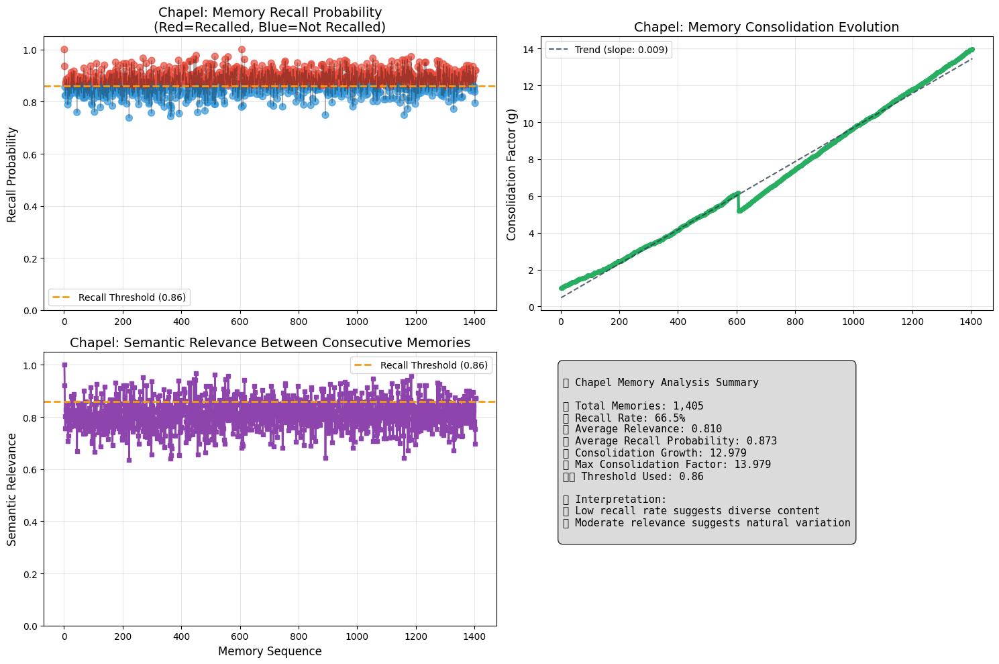


✅ Analysis complete!

🔍 Key insights to look for:
• Red points = memories that triggered recall
• Rising consolidation = pattern learning
• High relevance = similar physiological states
• Check CSV file for detailed memory data

📊 Quick Summary:
   Recall Rate: 66.5%
   Avg Relevance: 0.810
   Consolidation Growth: 12.979


In [ ]:
# Example usage
if __name__ == "__main__":
    # Example: Process Mathematics subject for Student
    csv_path = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features/fourth/Chapel_features_with_estimates_diverse_interpretations.csv"
    subject = "Chapel"

    print("🧠 Human-like Memory Consolidation Analysis")
    print("=" * 60)

    memory_system = process_subject_memory_enhanced(csv_path, subject)

    if memory_system:
        print("\n✅ Analysis complete!")
        print("\n🔍 Key insights to look for:")
        print("• Red points = memories that triggered recall")
        print("• Rising consolidation = pattern learning")
        print("• High relevance = similar physiological states")
        print("• Check CSV file for detailed memory data")

        # Print summary statistics
        stats = memory_system.get_summary_stats()
        if stats:
            print(f"\n📊 Quick Summary:")
            print(f"   Recall Rate: {stats['recall_rate']:.1f}%")
            print(f"   Avg Relevance: {stats['avg_relevance']:.3f}")
            print(f"   Consolidation Growth: {stats['consolidation_growth']:.3f}")

🧠 Human-like Memory Consolidation Analysis
📁 Loaded 11386 records from English_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing English Memory Sequence


Processing memories: 100%|██████████| 11386/11386 [19:24<00:00,  9.77memory/s]


✅ Processed 11386 memories
📊 Recall rate: 43.3% | Avg relevance: 0.776 | Final consolidation: 70.944
💾 Memory data saved to: memory_results/English_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: memory_results/English_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

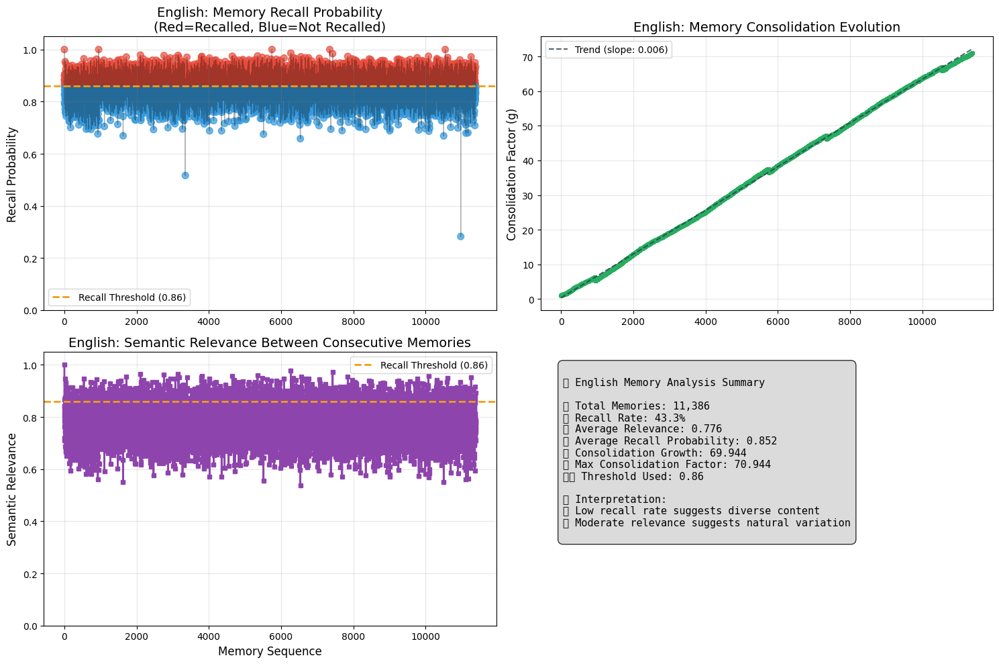


✅ Analysis complete!

🔍 Key insights to look for:
• Red points = memories that triggered recall
• Rising consolidation = pattern learning
• High relevance = similar physiological states
• Check CSV file for detailed memory data

📊 Quick Summary:
   Recall Rate: 43.3%
   Avg Relevance: 0.776
   Consolidation Growth: 69.944


In [ ]:
# Example usage
if __name__ == "__main__":
    # Example: Process Mathematics subject for Student
    csv_path = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features/fourth/English_features_with_estimates_diverse_interpretations.csv"
    subject = "English"

    print("🧠 Human-like Memory Consolidation Analysis")
    print("=" * 60)

    memory_system = process_subject_memory_enhanced(csv_path, subject)

    if memory_system:
        print("\n✅ Analysis complete!")
        print("\n🔍 Key insights to look for:")
        print("• Red points = memories that triggered recall")
        print("• Rising consolidation = pattern learning")
        print("• High relevance = similar physiological states")
        print("• Check CSV file for detailed memory data")

        # Print summary statistics
        stats = memory_system.get_summary_stats()
        if stats:
            print(f"\n📊 Quick Summary:")
            print(f"   Recall Rate: {stats['recall_rate']:.1f}%")
            print(f"   Avg Relevance: {stats['avg_relevance']:.3f}")
            print(f"   Consolidation Growth: {stats['consolidation_growth']:.3f}")

For 5 students


Processing Student: second

📚 Processing Language for second
📁 Loaded 11191 records from Language_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Language Memory Sequence


Processing memories: 100%|██████████| 11191/11191 [18:53<00:00,  9.87memory/s]


✅ Processed 11191 memories
📊 Recall rate: 51.2% | Avg relevance: 0.788 | Final consolidation: 83.899
💾 Memory data saved to: batch_memory_results/Student_second/Language_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_second/Language_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

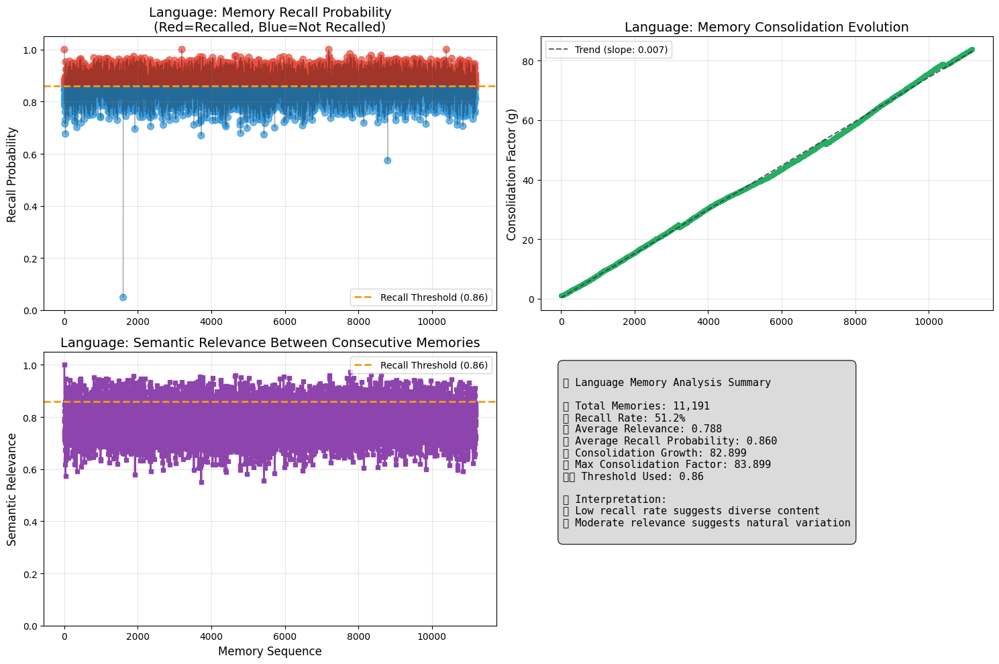

✅ Successfully processed Language for second
⚠️ File not found: Mathematics for second

📚 Processing English for second
📁 Loaded 10620 records from English_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing English Memory Sequence


Processing memories: 100%|██████████| 10620/10620 [18:07<00:00,  9.76memory/s]


✅ Processed 10620 memories
📊 Recall rate: 46.0% | Avg relevance: 0.780 | Final consolidation: 70.165
💾 Memory data saved to: batch_memory_results/Student_second/English_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_second/English_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

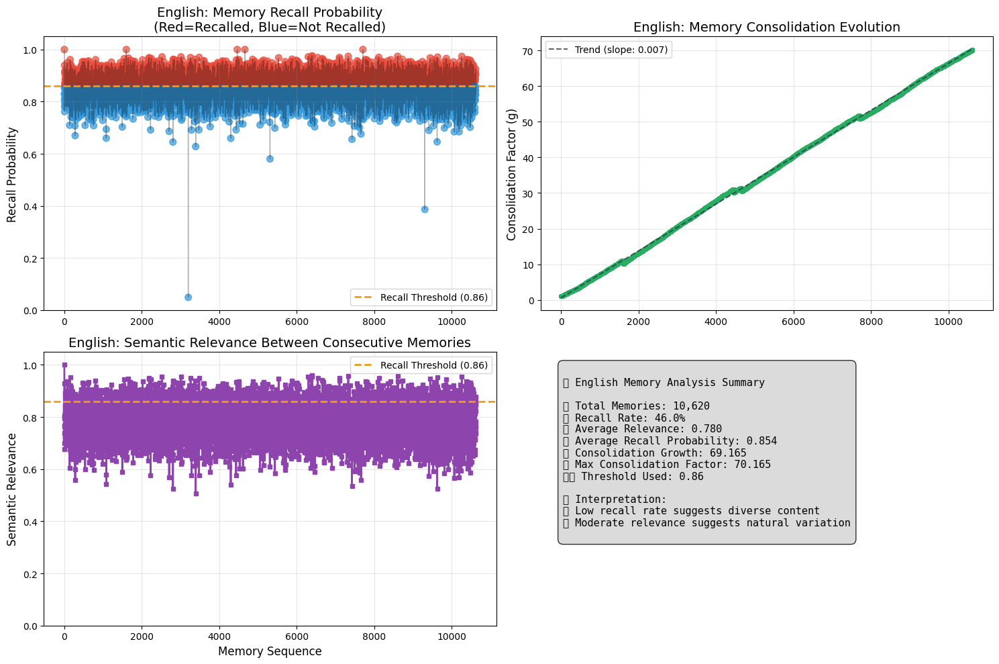

✅ Successfully processed English for second

📚 Processing PE for second
📁 Loaded 4797 records from PE_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing PE Memory Sequence


Processing memories: 100%|██████████| 4797/4797 [08:11<00:00,  9.76memory/s]


✅ Processed 4797 memories
📊 Recall rate: 51.6% | Avg relevance: 0.789 | Final consolidation: 36.047
💾 Memory data saved to: batch_memory_results/Student_second/PE_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_second/PE_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

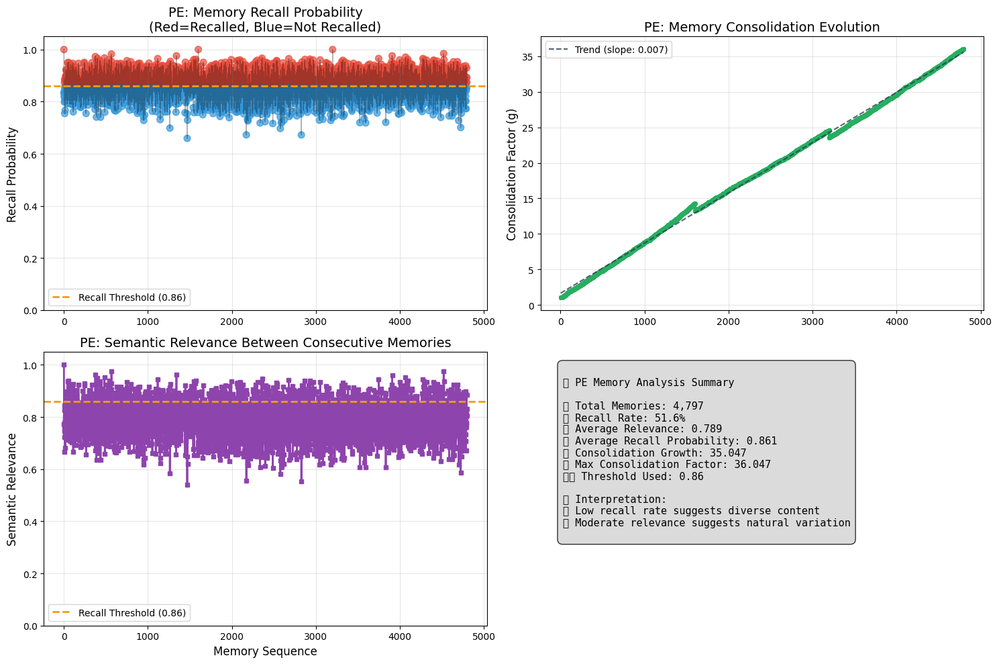

✅ Successfully processed PE for second

📚 Processing Science for second
📁 Loaded 11357 records from Science_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Science Memory Sequence


Processing memories: 100%|██████████| 11357/11357 [20:09<00:00,  9.39memory/s]


✅ Processed 11357 memories
📊 Recall rate: 47.2% | Avg relevance: 0.780 | Final consolidation: 76.394
💾 Memory data saved to: batch_memory_results/Student_second/Science_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_second/Science_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

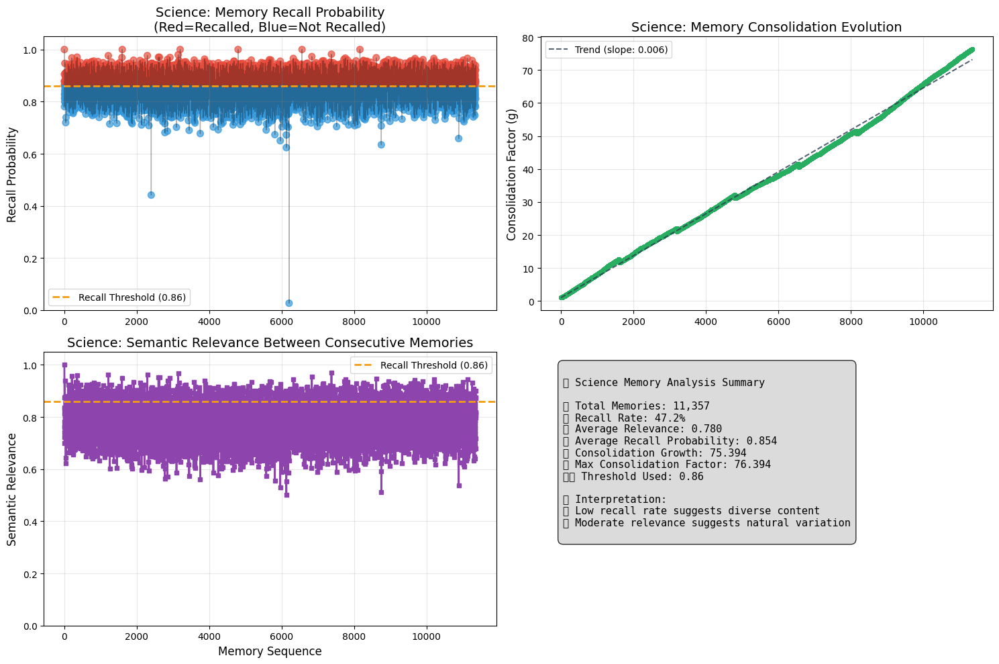

✅ Successfully processed Science for second

📚 Processing Chapel for second
📁 Loaded 799 records from Chapel_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Chapel Memory Sequence


Processing memories: 100%|██████████| 799/799 [01:27<00:00,  9.09memory/s]


✅ Processed 799 memories
📊 Recall rate: 71.0% | Avg relevance: 0.820 | Final consolidation: 9.489
💾 Memory data saved to: batch_memory_results/Student_second/Chapel_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_second/Chapel_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

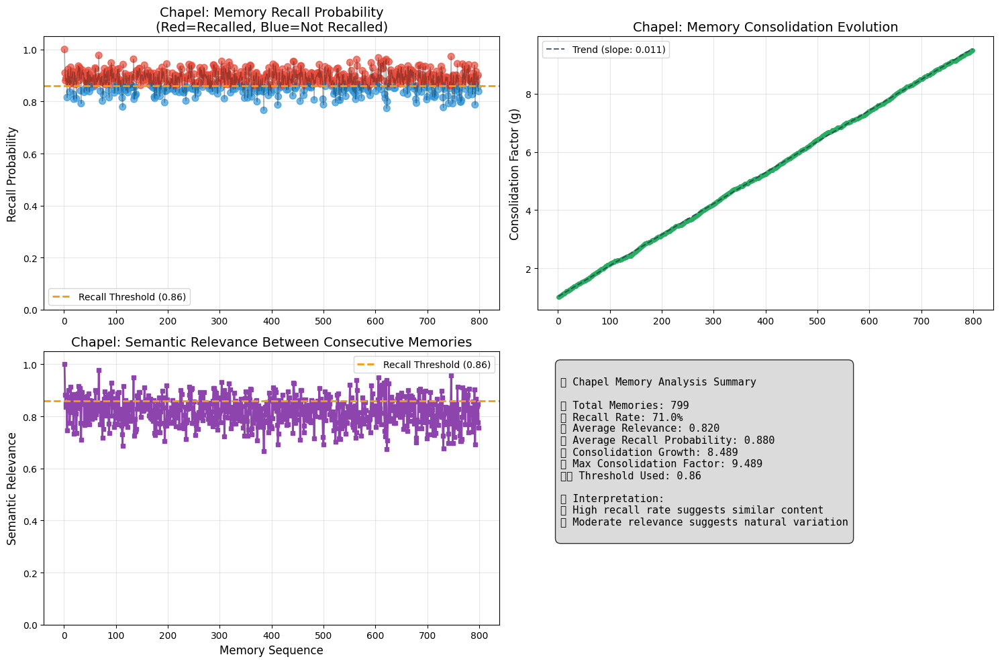

✅ Successfully processed Chapel for second

Processing Student: third

📚 Processing Language for third
📁 Loaded 14182 records from Language_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Language Memory Sequence


Processing memories: 100%|██████████| 14182/14182 [25:10<00:00,  9.39memory/s]


✅ Processed 14182 memories
📊 Recall rate: 45.1% | Avg relevance: 0.778 | Final consolidation: 92.918
💾 Memory data saved to: batch_memory_results/Student_third/Language_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_third/Language_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

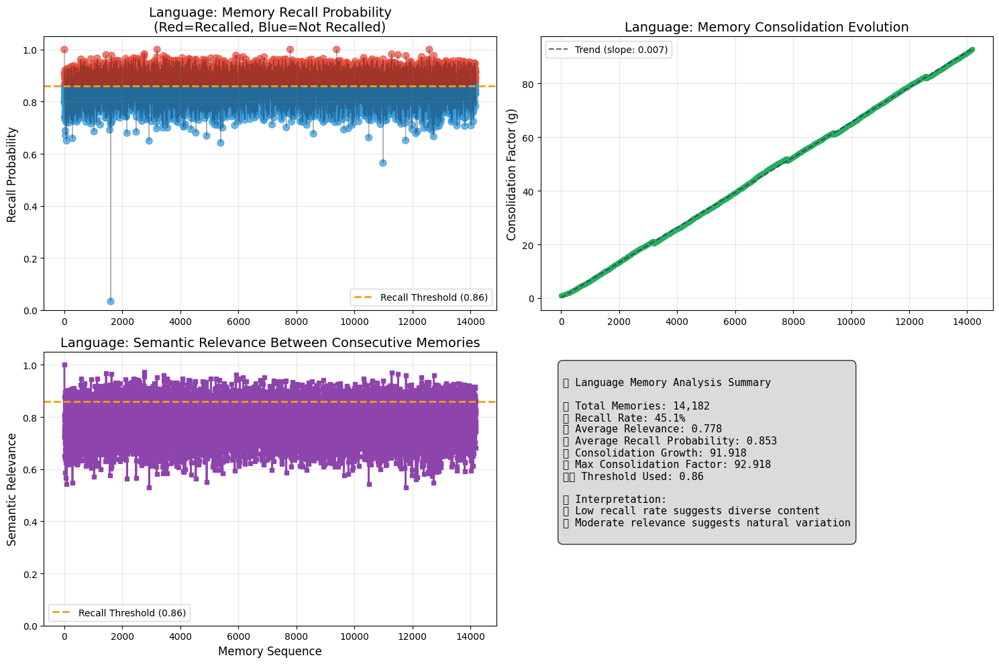

✅ Successfully processed Language for third
⚠️ File not found: Mathematics for third

📚 Processing English for third
📁 Loaded 11582 records from English_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing English Memory Sequence


Processing memories: 100%|██████████| 11582/11582 [21:16<00:00,  9.07memory/s]


✅ Processed 11582 memories
📊 Recall rate: 42.3% | Avg relevance: 0.774 | Final consolidation: 70.344
💾 Memory data saved to: batch_memory_results/Student_third/English_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_third/English_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

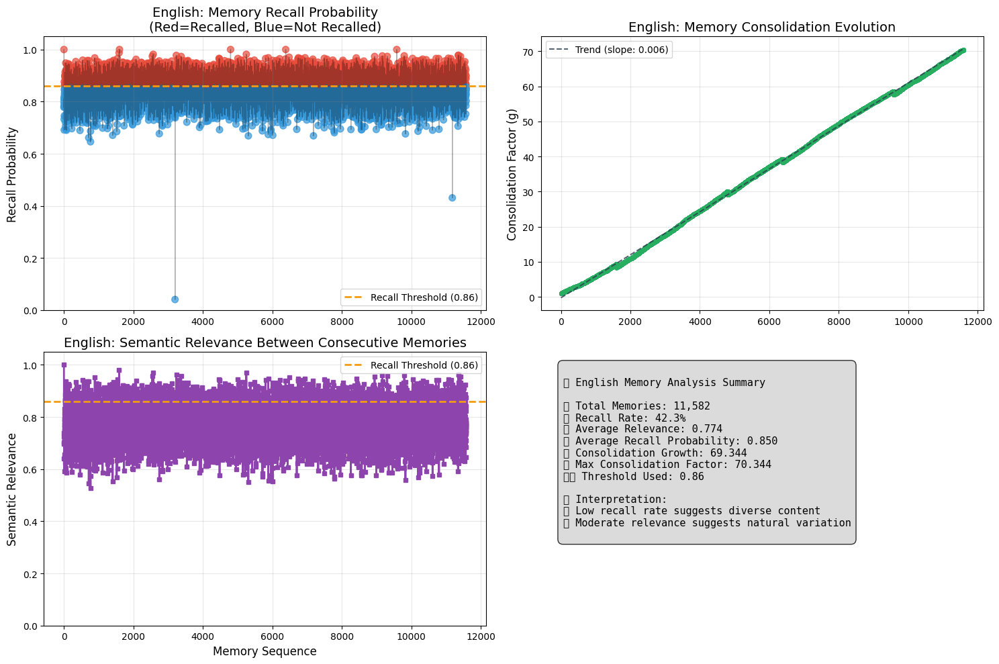

✅ Successfully processed English for third

📚 Processing PE for third
📁 Loaded 6367 records from PE_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing PE Memory Sequence


Processing memories: 100%|██████████| 6367/6367 [12:04<00:00,  8.79memory/s]


✅ Processed 6367 memories
📊 Recall rate: 50.1% | Avg relevance: 0.787 | Final consolidation: 45.741
💾 Memory data saved to: batch_memory_results/Student_third/PE_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_third/PE_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

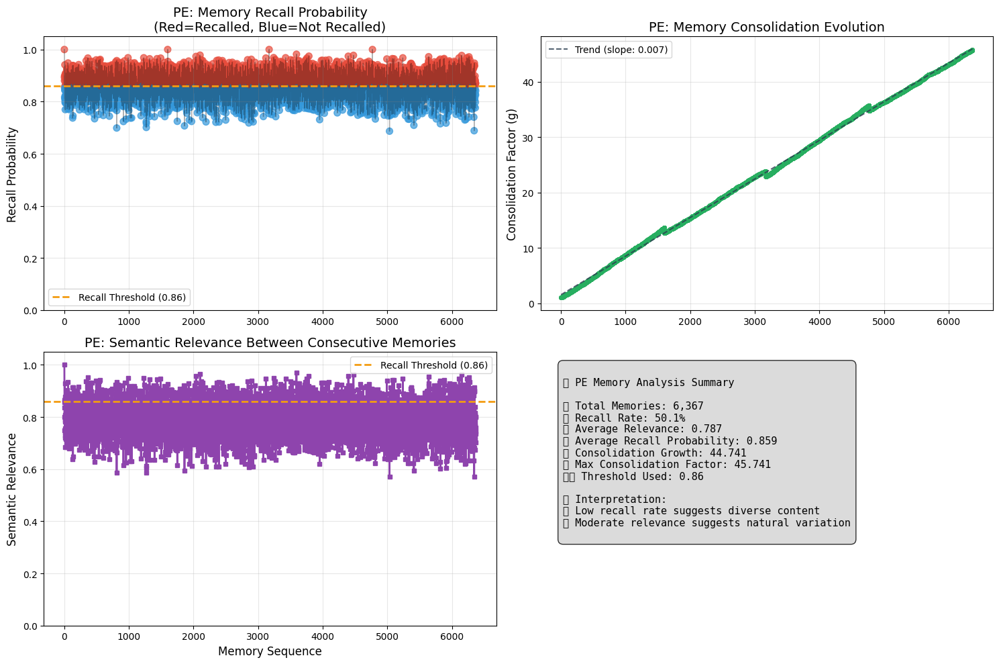

✅ Successfully processed PE for third

📚 Processing Science for third
📁 Loaded 9387 records from Science_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Science Memory Sequence


Processing memories: 100%|██████████| 9387/9387 [18:17<00:00,  8.55memory/s]


✅ Processed 9387 memories
📊 Recall rate: 43.3% | Avg relevance: 0.775 | Final consolidation: 57.850
💾 Memory data saved to: batch_memory_results/Student_third/Science_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_third/Science_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

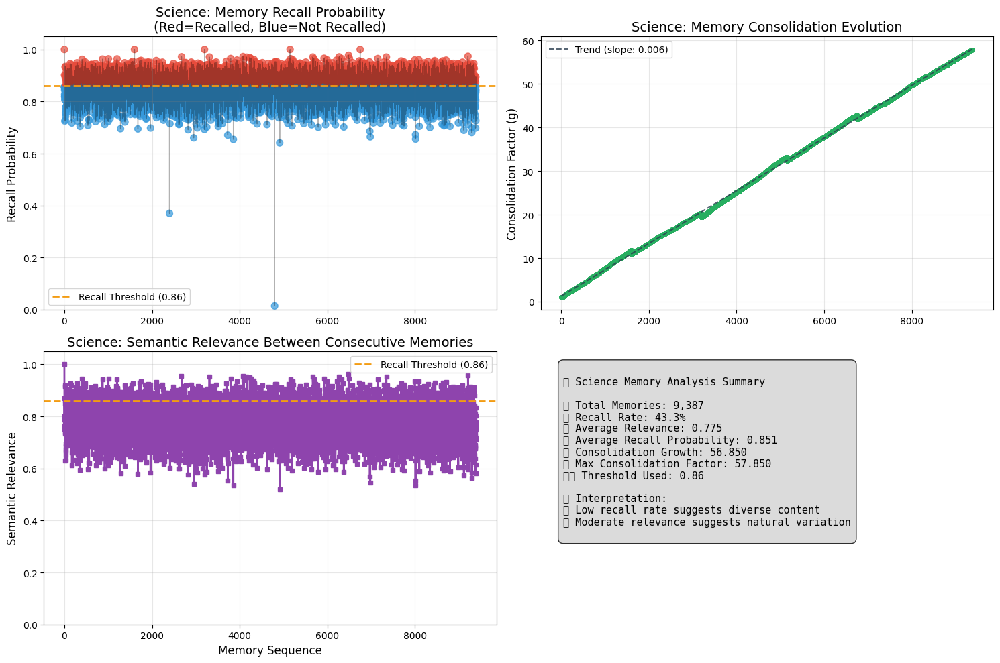

✅ Successfully processed Science for third

📚 Processing Chapel for third
📁 Loaded 1457 records from Chapel_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Chapel Memory Sequence


Processing memories: 100%|██████████| 1457/1457 [02:51<00:00,  8.49memory/s]


✅ Processed 1457 memories
📊 Recall rate: 60.4% | Avg relevance: 0.805 | Final consolidation: 13.169
💾 Memory data saved to: batch_memory_results/Student_third/Chapel_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_third/Chapel_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

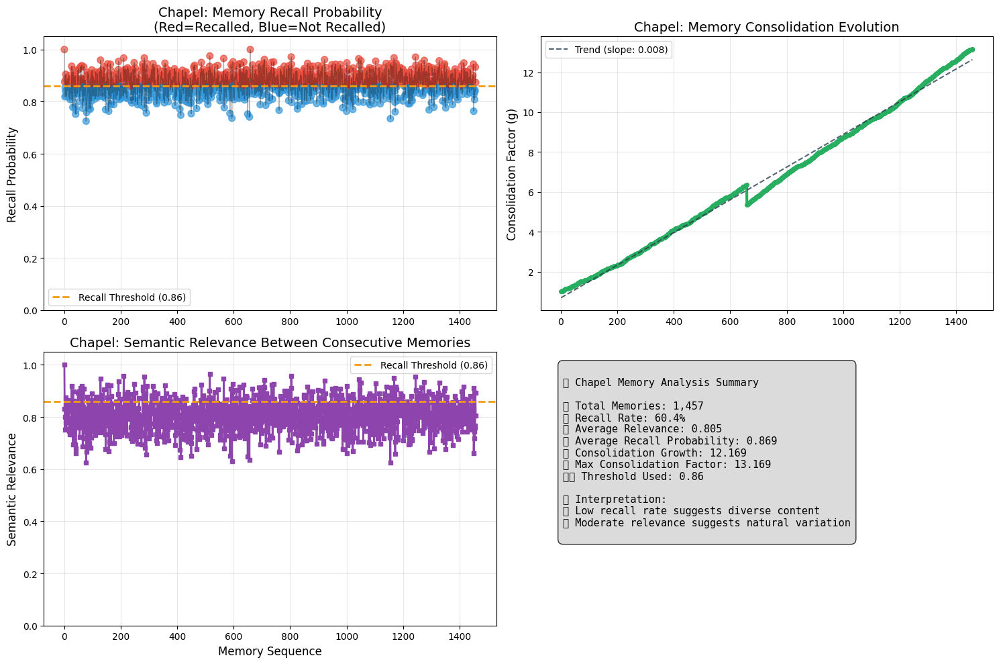

✅ Successfully processed Chapel for third

Processing Student: fourth

📚 Processing Language for fourth
📁 Loaded 13557 records from Language_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Language Memory Sequence


Processing memories: 100%|██████████| 13557/13557 [26:34<00:00,  8.50memory/s]


✅ Processed 13557 memories
📊 Recall rate: 47.6% | Avg relevance: 0.782 | Final consolidation: 92.638
💾 Memory data saved to: batch_memory_results/Student_fourth/Language_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fourth/Language_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

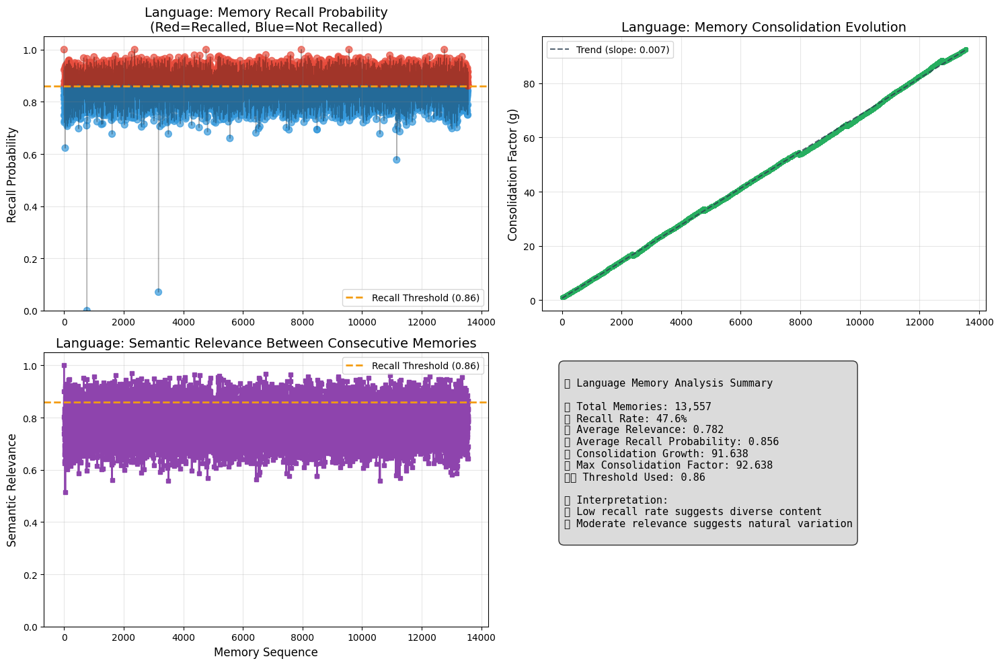

✅ Successfully processed Language for fourth
⚠️ File not found: Mathematics for fourth

📚 Processing English for fourth
📁 Loaded 11386 records from English_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing English Memory Sequence


Processing memories: 100%|██████████| 11386/11386 [22:44<00:00,  8.35memory/s]


✅ Processed 11386 memories
📊 Recall rate: 43.3% | Avg relevance: 0.776 | Final consolidation: 70.944
💾 Memory data saved to: batch_memory_results/Student_fourth/English_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fourth/English_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

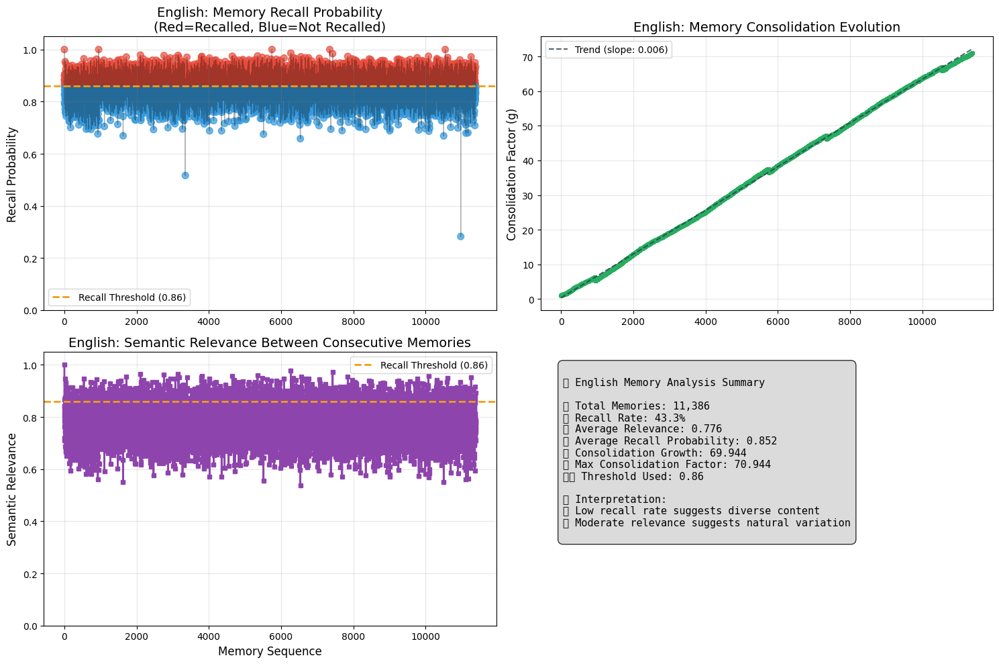

✅ Successfully processed English for fourth

📚 Processing PE for fourth
📁 Loaded 6393 records from PE_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing PE Memory Sequence


Processing memories: 100%|██████████| 6393/6393 [13:11<00:00,  8.07memory/s]


✅ Processed 6393 memories
📊 Recall rate: 49.9% | Avg relevance: 0.787 | Final consolidation: 45.801
💾 Memory data saved to: batch_memory_results/Student_fourth/PE_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fourth/PE_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

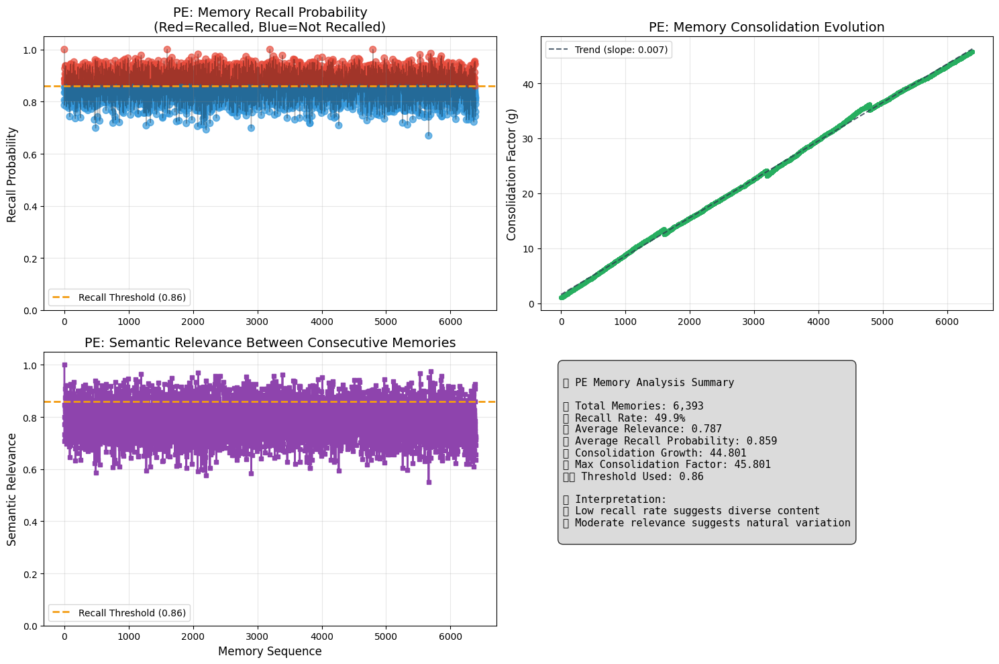

✅ Successfully processed PE for fourth

📚 Processing Science for fourth
📁 Loaded 10826 records from Science_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Science Memory Sequence


Processing memories: 100%|██████████| 10826/10826 [22:52<00:00,  7.89memory/s]


✅ Processed 10826 memories
📊 Recall rate: 43.0% | Avg relevance: 0.775 | Final consolidation: 66.820
💾 Memory data saved to: batch_memory_results/Student_fourth/Science_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fourth/Science_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

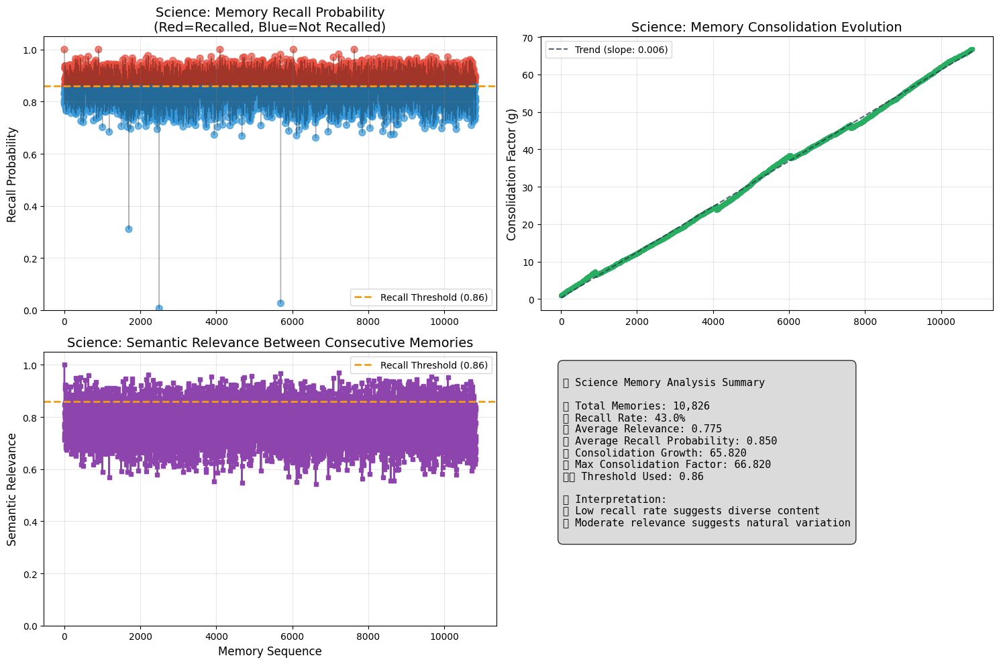

✅ Successfully processed Science for fourth

📚 Processing Chapel for fourth
📁 Loaded 1405 records from Chapel_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Chapel Memory Sequence


Processing memories: 100%|██████████| 1405/1405 [03:00<00:00,  7.80memory/s]


✅ Processed 1405 memories
📊 Recall rate: 66.5% | Avg relevance: 0.810 | Final consolidation: 13.979
💾 Memory data saved to: batch_memory_results/Student_fourth/Chapel_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fourth/Chapel_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

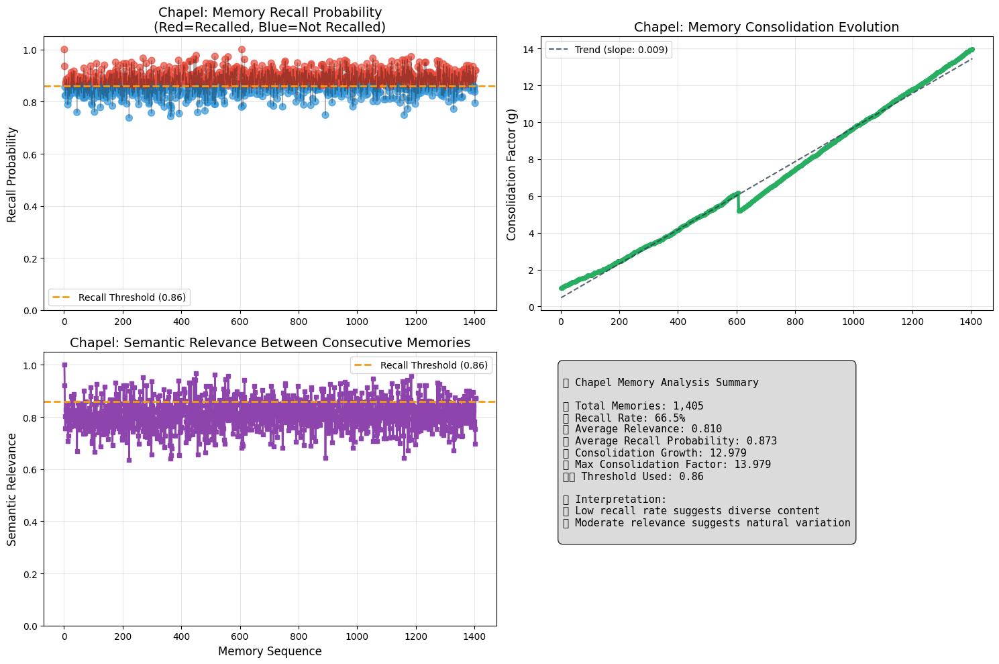

✅ Successfully processed Chapel for fourth

Processing Student: fifth

📚 Processing Language for fifth
📁 Loaded 12630 records from Language_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Language Memory Sequence


Processing memories: 100%|██████████| 12630/12630 [26:48<00:00,  7.85memory/s]


✅ Processed 12630 memories
📊 Recall rate: 54.1% | Avg relevance: 0.791 | Final consolidation: 99.337
💾 Memory data saved to: batch_memory_results/Student_fifth/Language_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fifth/Language_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

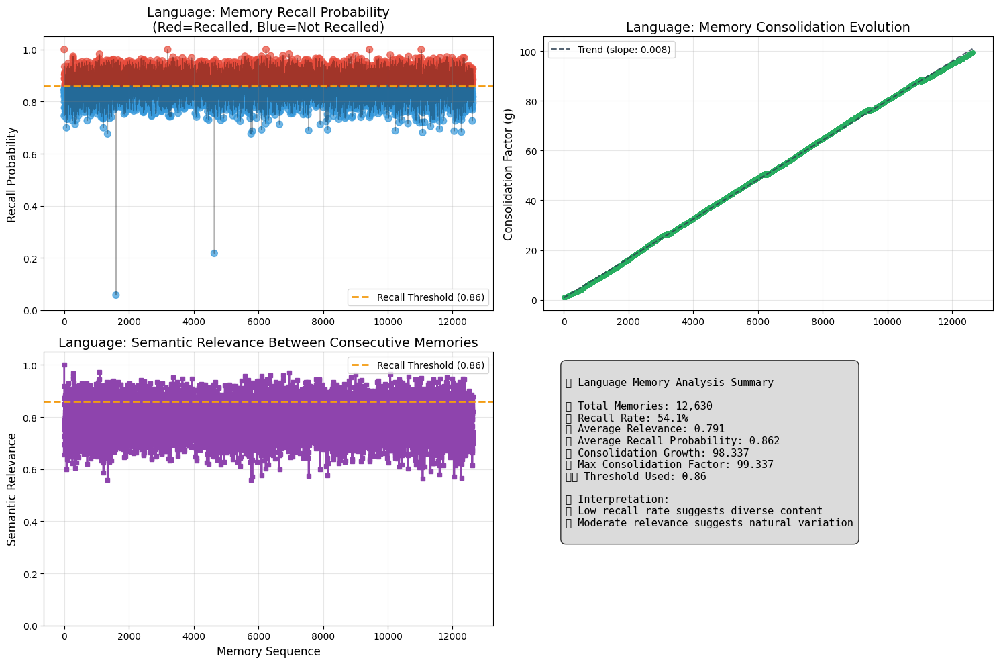

✅ Successfully processed Language for fifth
⚠️ File not found: Mathematics for fifth

📚 Processing English for fifth
📁 Loaded 12136 records from English_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing English Memory Sequence


Processing memories: 100%|██████████| 12136/12136 [26:16<00:00,  7.70memory/s]


✅ Processed 12136 memories
📊 Recall rate: 49.3% | Avg relevance: 0.783 | Final consolidation: 87.000
💾 Memory data saved to: batch_memory_results/Student_fifth/English_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fifth/English_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

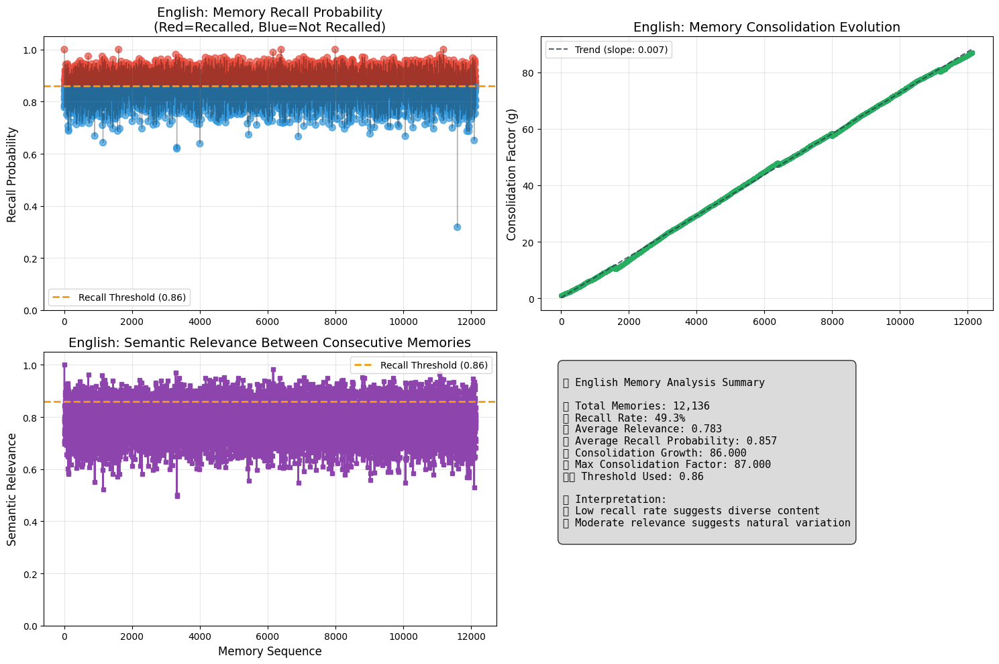

✅ Successfully processed English for fifth

📚 Processing PE for fifth
📁 Loaded 4797 records from PE_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing PE Memory Sequence


Processing memories: 100%|██████████| 4797/4797 [10:49<00:00,  7.39memory/s]


✅ Processed 4797 memories
📊 Recall rate: 58.4% | Avg relevance: 0.798 | Final consolidation: 40.982
💾 Memory data saved to: batch_memory_results/Student_fifth/PE_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fifth/PE_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

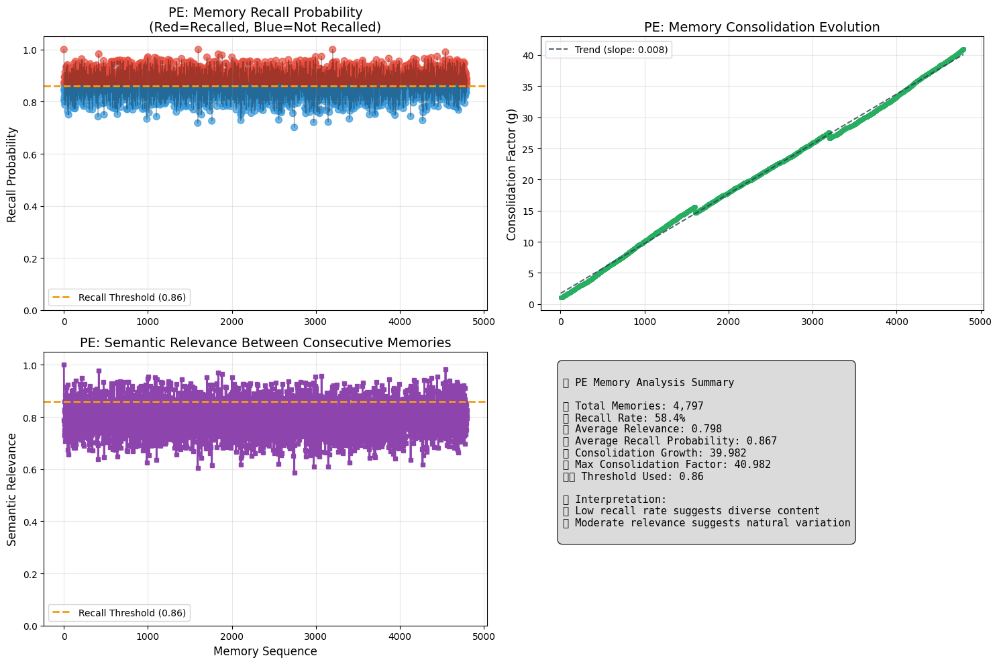

✅ Successfully processed PE for fifth

📚 Processing Science for fifth
📁 Loaded 9884 records from Science_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Science Memory Sequence


Processing memories: 100%|██████████| 9884/9884 [22:51<00:00,  7.20memory/s]


✅ Processed 9884 memories
📊 Recall rate: 50.6% | Avg relevance: 0.785 | Final consolidation: 71.874
💾 Memory data saved to: batch_memory_results/Student_fifth/Science_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fifth/Science_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

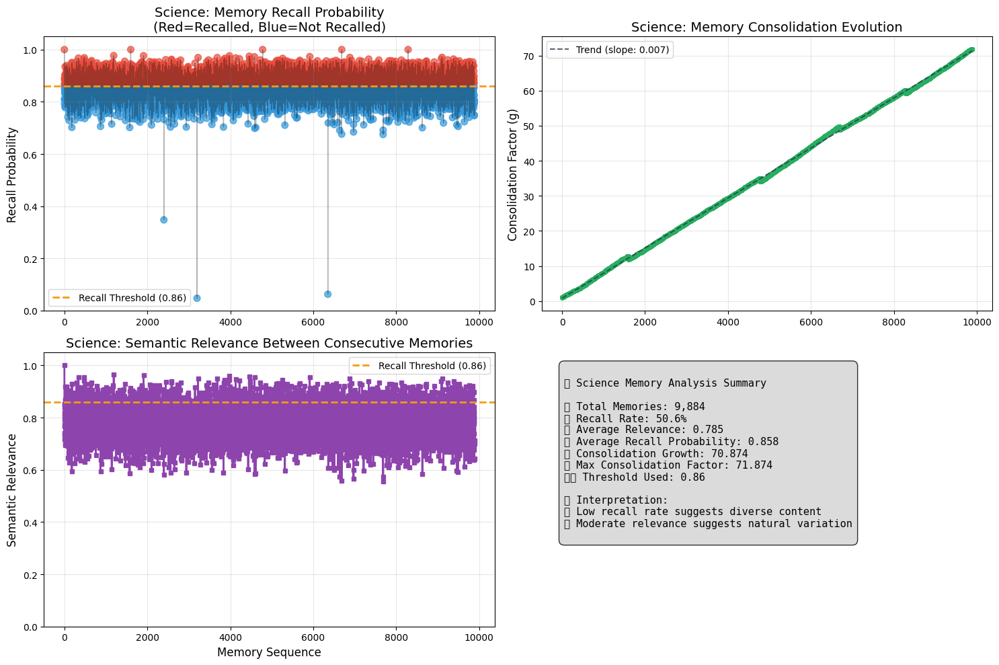

✅ Successfully processed Science for fifth

📚 Processing Chapel for fifth
📁 Loaded 1509 records from Chapel_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Chapel Memory Sequence


Processing memories: 100%|██████████| 1509/1509 [03:33<00:00,  7.05memory/s]


✅ Processed 1509 memories
📊 Recall rate: 69.2% | Avg relevance: 0.815 | Final consolidation: 15.629
💾 Memory data saved to: batch_memory_results/Student_fifth/Chapel_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_fifth/Chapel_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

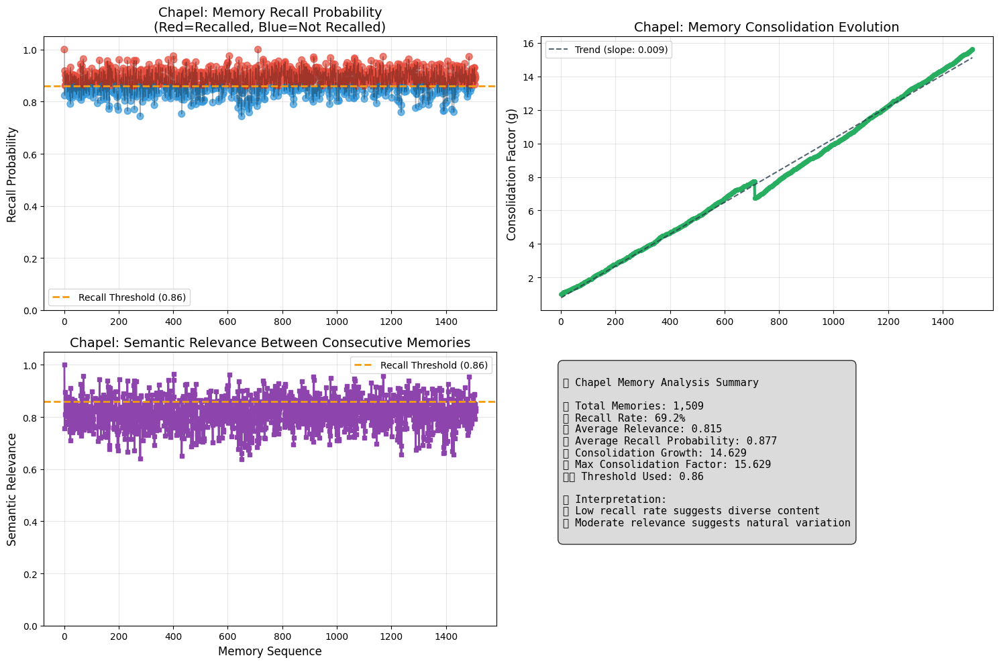

✅ Successfully processed Chapel for fifth

Processing Student: sixth

📚 Processing Language for sixth
📁 Loaded 9592 records from Language_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Language Memory Sequence


Processing memories: 100%|██████████| 9592/9592 [21:53<00:00,  7.30memory/s]


✅ Processed 9592 memories
📊 Recall rate: 52.2% | Avg relevance: 0.788 | Final consolidation: 72.979
💾 Memory data saved to: batch_memory_results/Student_sixth/Language_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_sixth/Language_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

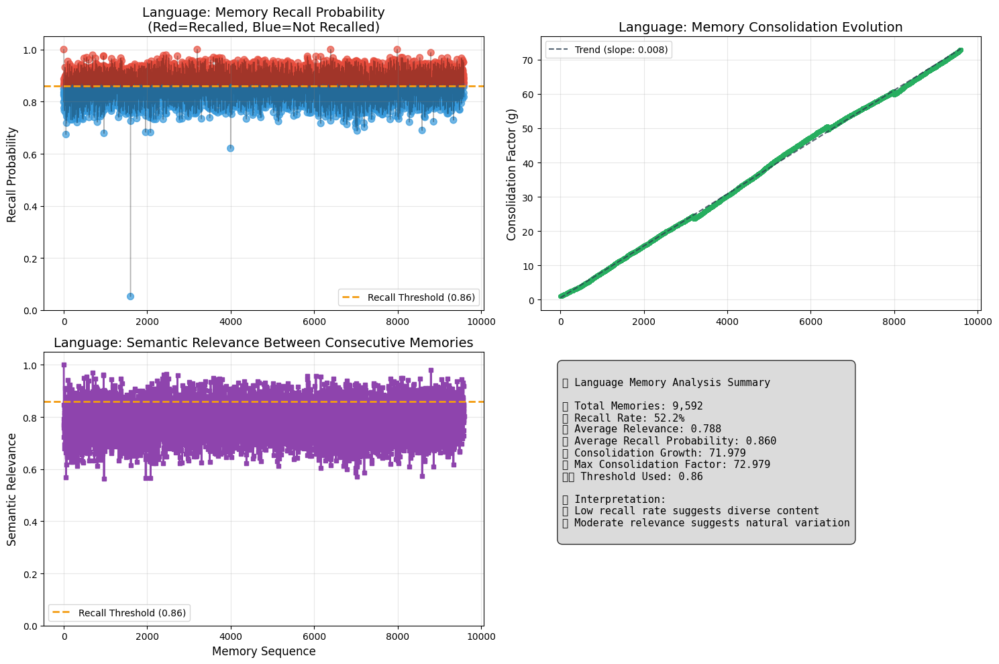

✅ Successfully processed Language for sixth
⚠️ File not found: Mathematics for sixth

📚 Processing English for sixth
📁 Loaded 10767 records from English_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing English Memory Sequence


Processing memories: 100%|██████████| 10767/10767 [25:04<00:00,  7.16memory/s]


✅ Processed 10767 memories
📊 Recall rate: 48.1% | Avg relevance: 0.782 | Final consolidation: 75.619
💾 Memory data saved to: batch_memory_results/Student_sixth/English_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_sixth/English_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

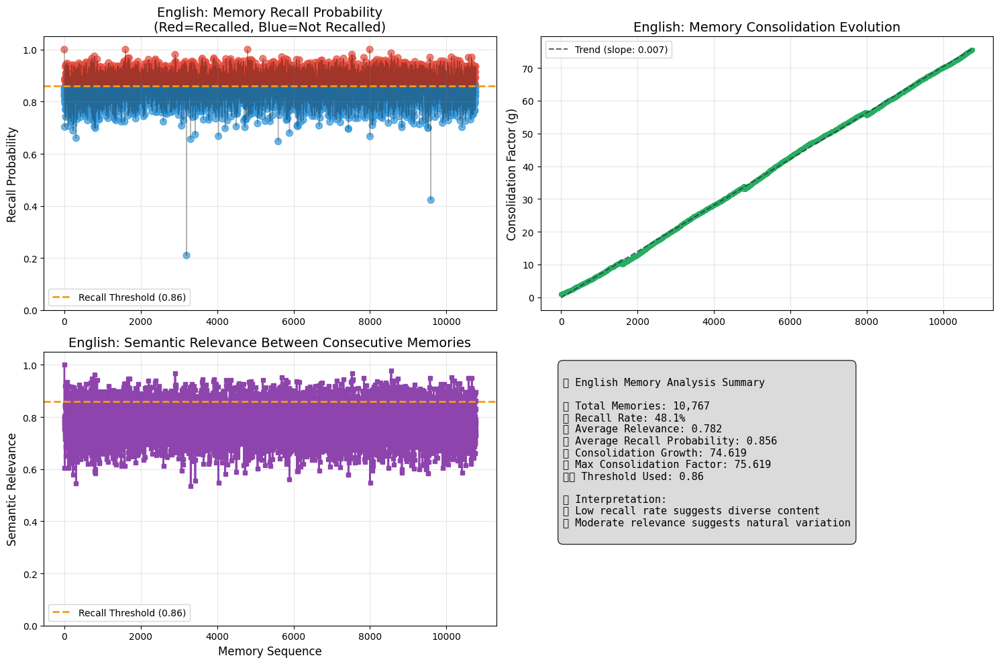

✅ Successfully processed English for sixth

📚 Processing PE for sixth
📁 Loaded 4797 records from PE_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing PE Memory Sequence


Processing memories: 100%|██████████| 4797/4797 [11:27<00:00,  6.98memory/s]


✅ Processed 4797 memories
📊 Recall rate: 57.8% | Avg relevance: 0.796 | Final consolidation: 40.517
💾 Memory data saved to: batch_memory_results/Student_sixth/PE_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_sixth/PE_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

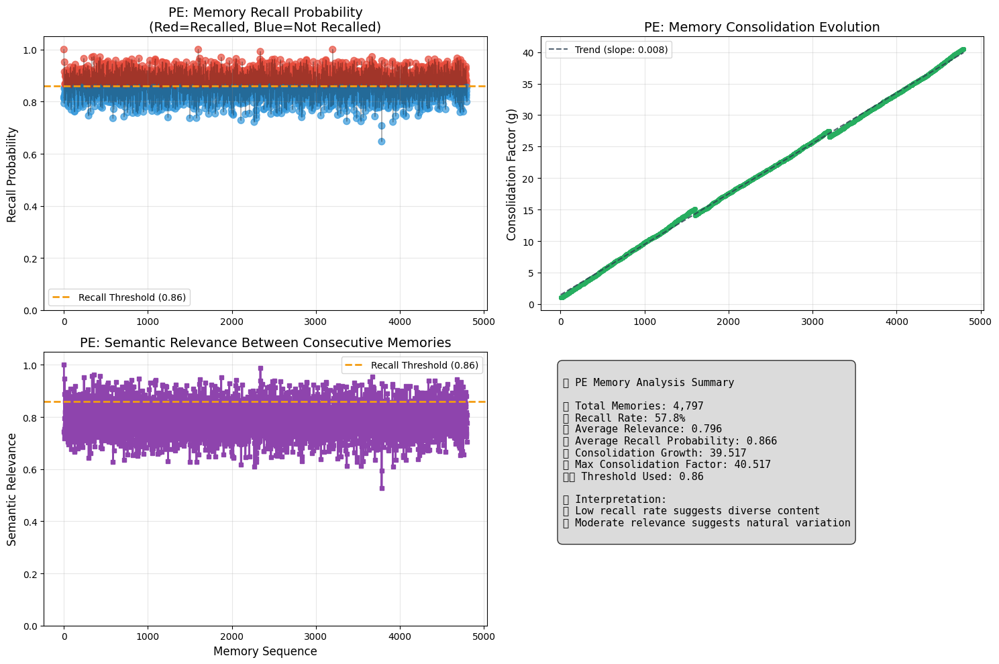

✅ Successfully processed PE for sixth

📚 Processing Science for sixth
📁 Loaded 6729 records from Science_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Science Memory Sequence


Processing memories: 100%|██████████| 6729/6729 [16:15<00:00,  6.90memory/s]


✅ Processed 6729 memories
📊 Recall rate: 50.8% | Avg relevance: 0.786 | Final consolidation: 49.191
💾 Memory data saved to: batch_memory_results/Student_sixth/Science_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_sixth/Science_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

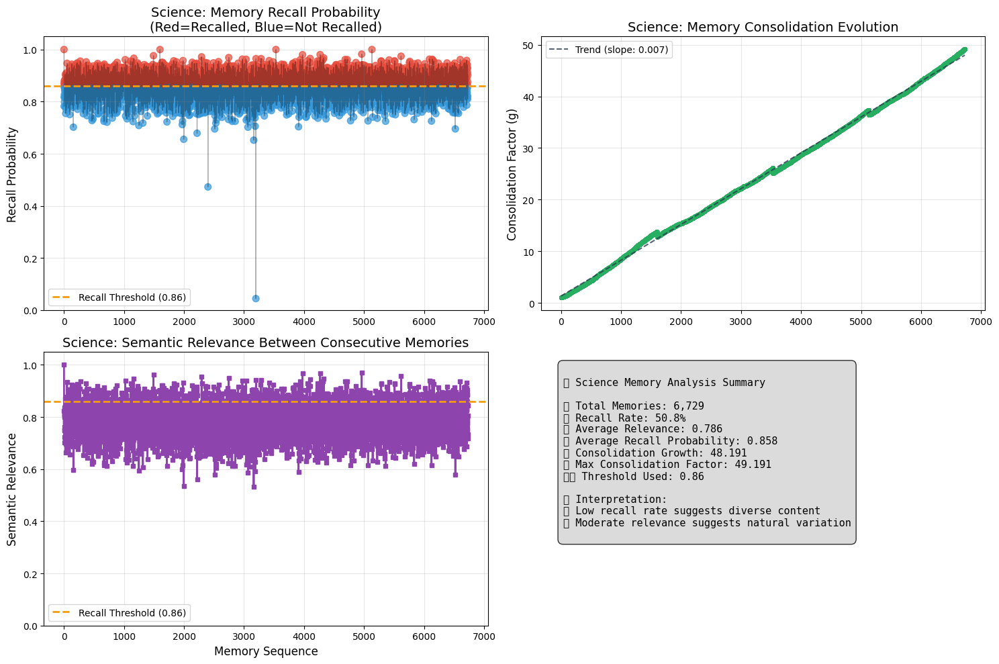

✅ Successfully processed Science for sixth

📚 Processing Chapel for sixth
📁 Loaded 1526 records from Chapel_features_with_estimates_diverse_interpretations.csv
📋 Using interpretation column: Physiological_Interpretation

🧠 Processing Chapel Memory Sequence


Processing memories: 100%|██████████| 1526/1526 [03:44<00:00,  6.80memory/s]


✅ Processed 1526 memories
📊 Recall rate: 70.7% | Avg relevance: 0.816 | Final consolidation: 16.154
💾 Memory data saved to: batch_memory_results/Student_sixth/Chapel_features_with_estimates_diverse_interpretations_memory_analysis.csv


/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-4-3543397072.py:263: UserWarning: Glyph 127898 (\N{LEVEL SLIDER}) missing from font(s) DejaVu Sa

📊 Visualization saved to: batch_memory_results/Student_sixth/Chapel_features_with_estimates_diverse_interpretations_memory_visualization.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

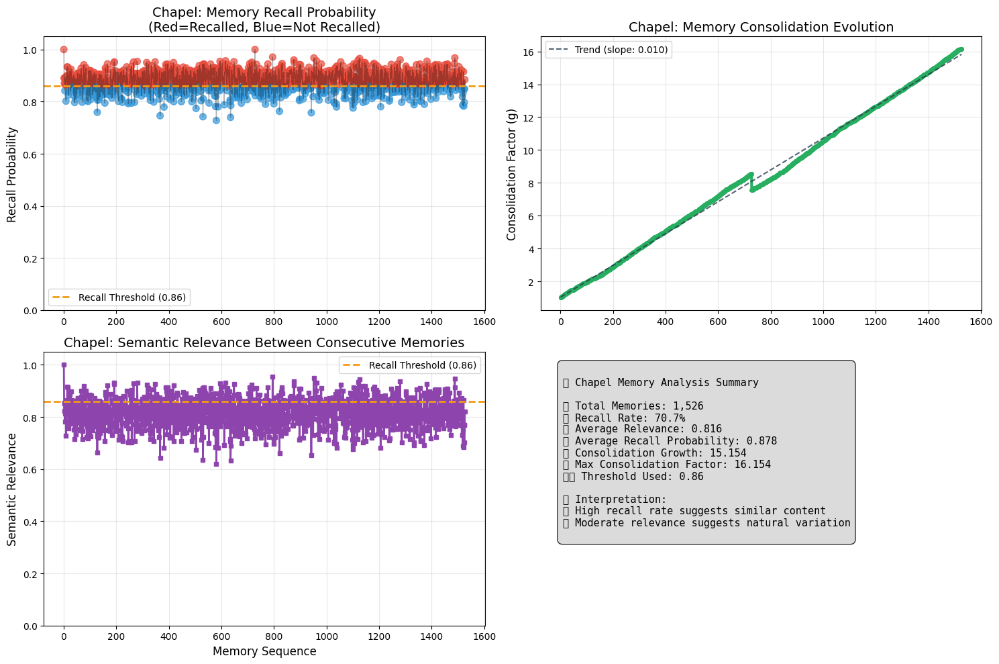

✅ Successfully processed Chapel for sixth


In [ ]:
# Define your students and subjects
students = ["second", "third", "fourth", "fifth","sixth"]
subjects = ["Language", "Mathematics", "English", "PE", "Science", "Chapel"]  # Add all subjects from class_table.csv

base_path = "/content/drive/MyDrive/SegregatedParticipants/Physiological_Features"

# Process all combinations
for student in students:
    print(f"\n{'='*50}")
    print(f"Processing Student: {student}")
    print(f"{'='*50}")

    for subject in subjects:
        # Construct the file path
        file_path = f"{base_path}/{student}/{subject}_features_with_estimates_diverse_interpretations.csv"

        # Check if file exists
        if os.path.exists(file_path):
            print(f"\n📚 Processing {subject} for {student}")

            # Process the memory
            memory_system = process_subject_memory_enhanced(
                csv_file_path=file_path,
                subject_name=subject,
                output_dir=f"batch_memory_results/Student_{student}"
            )

            if memory_system:
                print(f"✅ Successfully processed {subject} for {student}")
            else:
                print(f"❌ Failed to process {subject} for {student}")
        else:
            print(f"⚠️ File not found: {subject} for {student}")

🔗 Starting complete data matching pipeline...
📅 Loading class table...
✅ Loaded 248 class schedule records
Class table columns: ['Class_id', 'Room', 'Start_time', 'Finish_time', 'Class_len', 'Week', 'Weekday', 'Class_no', 'Subject', 'is_Form']
Sample class table data:
   Class_id Room Start_time Finish_time Class_len  Week  Weekday  Class_no  \
0         1   R6       9:00        9:40     short     1        1         1   
1         2   R3       9:40       11:00      long     1        1         2   
2         3   R3      11:25       12:05     short     1        1         3   
3         4   R3      12:05       13:25      long     1        1         4   
4         5   R3      14:15       15:35      long     1        1         5   

    Subject is_Form  
0  Assembly     all  
1  Language       0  
2      Form      R3  
3     Maths       0  
4   English      R3  
⚠️ Warning: Missing columns in class table: ['start_time', 'finish_time', 'subject']
📊 Loading survey data...
✅ Loaded 488 survey 

LinAlgError: SVD did not converge in Linear Least Squares

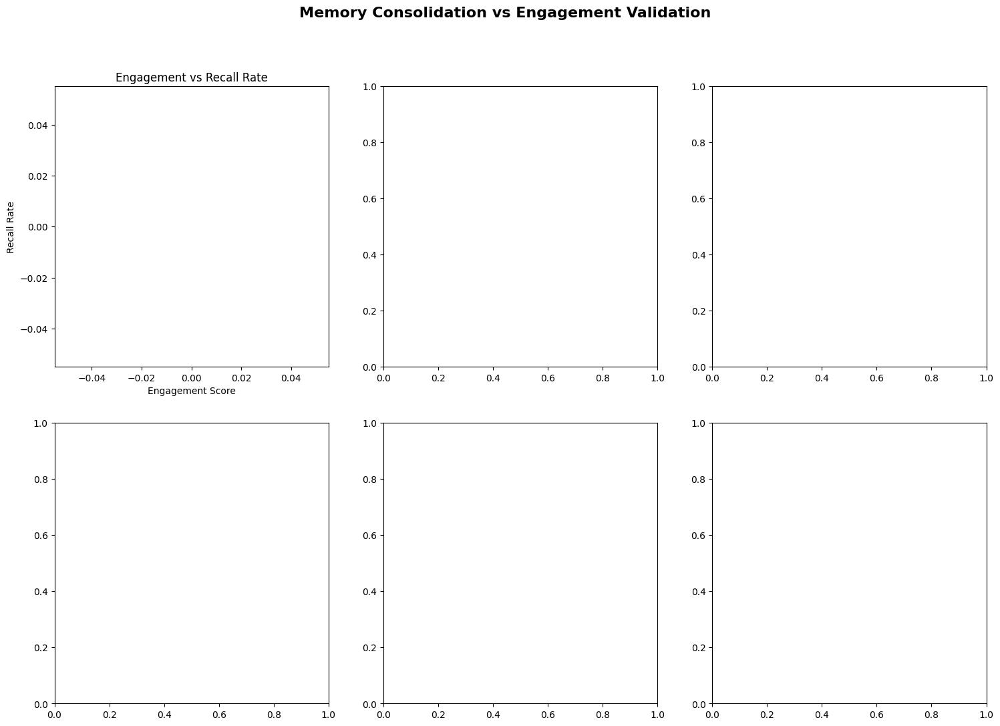

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
import os
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

class MemoryEngagementValidator:
    def __init__(self, survey_path, memory_results_path, class_table_path):
        """
        Initialize the validation system with time-range matching

        Args:
            survey_path: Path to student_survey.csv
            memory_results_path: Path to batch_memory_results folder
            class_table_path: Path to class_table.csv for temporal matching
        """
        self.survey_path = survey_path
        self.memory_results_path = memory_results_path
        self.class_table_path = class_table_path
        self.survey_data = None
        self.memory_data = None
        self.class_table = None
        self.validation_results = None

        # Participant mapping
        self.participant_mapping = {
            'second': 2,
            'third': 3,
            'fourth': 4,
            'fifth': 5,
            'sixth': 6
        }

    def load_class_table(self):
        """Load class table for temporal matching"""
        print("📅 Loading class table...")

        self.class_table = pd.read_csv(self.class_table_path)
        print(f"✅ Loaded {len(self.class_table)} class schedule records")

        # Display class table structure for debugging
        print("Class table columns:", self.class_table.columns.tolist())
        print("Sample class table data:")
        print(self.class_table.head())

        # Check required columns
        required_cols = ['Week', 'Weekday', 'start_time', 'finish_time', 'subject']
        missing_cols = [col for col in required_cols if col not in self.class_table.columns]
        if missing_cols:
            print(f"⚠️ Warning: Missing columns in class table: {missing_cols}")

        return self.class_table

    def load_survey_data(self):
        """Load and process survey data with engagement calculation"""
        print("📊 Loading survey data...")

        self.survey_data = pd.read_csv(self.survey_path)
        print(f"✅ Loaded {len(self.survey_data)} survey responses")

        # Display survey data structure
        print("Survey columns:", self.survey_data.columns.tolist())
        print(f"Unique Pids: {sorted(self.survey_data['Pid'].unique())}")
        print(f"Week range: {self.survey_data['Week'].min()} - {self.survey_data['Week'].max()}")
        print(f"Weekday range: {self.survey_data['Weekday'].min()} - {self.survey_data['Weekday'].max()}")

        # Calculate engagement scores (items 2&4 reverse scored)
        engagement_cols = ['Engage_1', 'Engage_2', 'Engage_3', 'Engage_4', 'Engage_5']

        if all(col in self.survey_data.columns for col in engagement_cols):
            # Convert engagement responses to numeric
            for col in engagement_cols:
                self.survey_data[col] = pd.to_numeric(self.survey_data[col], errors='coerce')

            # Apply reverse scoring to items 2 and 4
            self.survey_data['Engage_2_reversed'] = 6 - self.survey_data['Engage_2']
            self.survey_data['Engage_4_reversed'] = 6 - self.survey_data['Engage_4']

            # Calculate engagement score: (Engage_1 + (6-Engage_2) + Engage_3 + (6-Engage_4) + Engage_5) / 5
            self.survey_data['Engagement_Score'] = (
                self.survey_data['Engage_1'] +
                self.survey_data['Engage_2_reversed'] +
                self.survey_data['Engage_3'] +
                self.survey_data['Engage_4_reversed'] +
                self.survey_data['Engage_5']
            ) / 5

            print(f"📈 Engagement scores calculated. Range: {self.survey_data['Engagement_Score'].min():.2f} - {self.survey_data['Engagement_Score'].max():.2f}")
        else:
            print("⚠️ Warning: Engagement columns not found. Please update column names.")

        return self.survey_data

    def load_memory_data(self):
        """Load all memory consolidation results"""
        print("🧠 Loading memory consolidation data...")

        memory_files = []
        memory_path = Path(self.memory_results_path)

        # Find all memory analysis CSV files
        for student_dir in memory_path.glob("Student_*"):
            if student_dir.is_dir():
                for csv_file in student_dir.glob("*_memory_analysis.csv"):
                    memory_files.append(csv_file)

        if not memory_files:
            print("❌ No memory analysis files found!")
            return None

        # Load and combine all memory data
        all_memory_data = []
        for file_path in memory_files:
            try:
                df = pd.read_csv(file_path)

                # Extract student and subject info from file path
                student_name = file_path.parent.name.replace("Student_", "")
                subject_name = df['Subject'].iloc[0] if 'Subject' in df.columns else "Unknown"

                # Add metadata
                df['Participant_ID'] = student_name
                df['File_Source'] = str(file_path)

                all_memory_data.append(df)

            except Exception as e:
                print(f"⚠️ Error loading {file_path}: {e}")

        if all_memory_data:
            self.memory_data = pd.concat(all_memory_data, ignore_index=True)
            print(f"✅ Loaded memory data for {len(self.memory_data)} memories across {len(all_memory_data)} files")
        else:
            print("❌ No memory data could be loaded!")

        return self.memory_data

    def time_falls_in_range(self, survey_time, start_time, finish_time):
        """Check if survey time falls within class time range"""
        try:
            # Convert survey time from "HH:MM:SS" to "HH:MM"
            survey_time_short = survey_time[:5]  # "09:15:00" → "09:15"

            # Compare times as strings (works for HH:MM format)
            return start_time <= survey_time_short <= finish_time
        except:
            return False

    def match_survey_with_subjects(self):
        """Match survey entries with subjects using time range matching"""
        print("🕐 Matching survey entries with subjects using time ranges...")

        if self.survey_data is None or self.class_table is None:
            print("❌ Survey data or class table not loaded!")
            return None

        survey_with_subjects = []
        unmatched_count = 0

        for idx, survey_row in self.survey_data.iterrows():
            matched = False

            # Find matching class entry
            for _, class_row in self.class_table.iterrows():
                if (survey_row['Week'] == class_row['Week'] and
                    survey_row['Weekday'] == class_row['Weekday'] and
                    self.time_falls_in_range(survey_row['Time'],
                                           class_row['Start_time'],
                                           class_row['Finish_time'])):

                    # Add subject to survey row
                    survey_row_with_subject = survey_row.copy()
                    survey_row_with_subject['Subject'] = class_row['Subject']
                    survey_with_subjects.append(survey_row_with_subject)
                    matched = True
                    break

            if not matched:
                unmatched_count += 1
                if unmatched_count <= 5:  # Show first 5 unmatched entries
                    print(f"⚠️ Unmatched survey entry: Pid={survey_row['Pid']}, Week={survey_row['Week']}, Weekday={survey_row['Weekday']}, Time={survey_row['Time']}")

        if survey_with_subjects:
            survey_with_subjects_df = pd.DataFrame(survey_with_subjects)
            print(f"✅ Matched {len(survey_with_subjects_df)} survey entries with subjects")
            print(f"⚠️ {unmatched_count} survey entries could not be matched (skipped)")

            # Show subject distribution
            subject_counts = survey_with_subjects_df['Subject'].value_counts()
            print(f"📊 Survey entries by subject:\n{subject_counts}")

            return survey_with_subjects_df
        else:
            print("❌ No survey entries could be matched with subjects!")
            return None

    def calculate_memory_metrics(self):
        """Calculate aggregated memory metrics per participant-subject combination"""
        if self.memory_data is None:
            print("❌ No memory data available. Load memory data first.")
            return None

        print("🔢 Calculating memory metrics...")

        # Group by participant and subject
        memory_metrics = self.memory_data.groupby(['Participant_ID', 'Subject']).agg({
            'Recall_Probability': ['mean', 'std', 'max', 'min'],
            'Semantic_Relevance': ['mean', 'std', 'max', 'min'],
            'Consolidation_Factor': ['mean', 'std', 'max', 'min'],
            'Recalled': ['sum', 'count', 'mean'],  # sum=total recalls, count=total memories, mean=recall rate
            'Elapsed_Time_Seconds': ['mean', 'sum'],
            'Memory_Index': 'count'  # Total number of memories
        }).reset_index()

        # Flatten column names
        memory_metrics.columns = ['_'.join(col).strip() if col[1] else col[0] for col in memory_metrics.columns.values]

        # Rename for clarity
        memory_metrics.rename(columns={
            'Participant_ID_': 'Participant_ID',
            'Subject_': 'Subject',
            'Recalled_mean': 'Recall_Rate',
            'Recalled_sum': 'Total_Recalls',
            'Recalled_count': 'Total_Memories',
            'Memory_Index_count': 'Memory_Count'
        }, inplace=True)

        # Add Pid mapping
        memory_metrics['Pid'] = memory_metrics['Participant_ID'].map(self.participant_mapping)
        memory_metrics = memory_metrics.dropna(subset=['Pid'])
        memory_metrics['Pid'] = memory_metrics['Pid'].astype(int)

        print(f"✅ Calculated metrics for {len(memory_metrics)} participant-subject combinations")
        print(f"📊 Memory data by participant:\n{memory_metrics.groupby('Participant_ID').size()}")
        print(f"📊 Memory data by subject:\n{memory_metrics.groupby('Subject').size()}")

        return memory_metrics

    def average_survey_by_participant_subject(self, survey_with_subjects):
        """Average multiple survey entries per participant-subject combination"""
        print("📊 Averaging survey responses by participant-subject...")

        # Group by Pid and Subject, take mean of all numeric columns
        numeric_cols = ['Engagement_Score', 'Arousal', 'Valence', 'Confidence_level', 'Thermal_sensation']
        available_cols = [col for col in numeric_cols if col in survey_with_subjects.columns]

        survey_averaged = survey_with_subjects.groupby(['Pid', 'Subject']).agg(
            {col: 'mean' for col in available_cols}
        ).reset_index()

        # Also keep count of how many survey entries were averaged
        survey_counts = survey_with_subjects.groupby(['Pid', 'Subject']).size().reset_index(name='Survey_Entry_Count')
        survey_averaged = survey_averaged.merge(survey_counts, on=['Pid', 'Subject'])

        print(f"✅ Averaged survey data: {len(survey_averaged)} participant-subject combinations")
        print(f"📊 Survey entries per combination (sample):")
        print(survey_averaged['Survey_Entry_Count'].value_counts().head())

        return survey_averaged

    def match_survey_memory_data(self):
        """Complete matching pipeline: survey + class table + memory data"""
        print("🔗 Starting complete data matching pipeline...")

        # Step 1: Load all data
        if self.class_table is None:
            self.load_class_table()
        if self.survey_data is None:
            self.load_survey_data()
        if self.memory_data is None:
            self.load_memory_data()

        # Step 2: Match survey with subjects using time ranges
        survey_with_subjects = self.match_survey_with_subjects()
        if survey_with_subjects is None:
            return None

        # Step 3: Average survey entries by participant-subject
        survey_averaged = self.average_survey_by_participant_subject(survey_with_subjects)

        # Step 4: Calculate memory metrics
        memory_metrics = self.calculate_memory_metrics()
        if memory_metrics is None:
            return None

        # Step 5: Final matching
        print("🔗 Final matching: survey averages + memory metrics...")
        validation_results = survey_averaged.merge(
            memory_metrics,
            on=['Pid', 'Subject'],
            how='inner'
        )

        print(f"✅ Final validation dataset: {len(validation_results)} records")

        if len(validation_results) == 0:
            print("❌ No matches found! Debugging info:")
            print("Survey participants:", sorted(survey_averaged['Pid'].unique()))
            print("Memory participants:", sorted(memory_metrics['Pid'].unique()))
            print("Survey subjects:", sorted(survey_averaged['Subject'].unique()))
            print("Memory subjects:", sorted(memory_metrics['Subject'].unique()))
        else:
            print(f"📊 Validation data by participant:\n{validation_results.groupby('Pid').size()}")
            print(f"📊 Validation data by subject:\n{validation_results.groupby('Subject').size()}")

        self.validation_results = validation_results
        return validation_results

    def validate_correlations(self):
        """Calculate correlations between memory metrics and engagement scores"""
        if self.validation_results is None:
            print("❌ No validation data available. Run match_survey_memory_data first.")
            return None

        print("📊 Calculating correlations...")

        # Define memory metrics to correlate
        memory_metrics = [
            'Recall_Rate', 'Recall_Probability_mean', 'Semantic_Relevance_mean',
            'Consolidation_Factor_mean', 'Total_Recalls', 'Total_Memories'
        ]

        # Define survey metrics to correlate
        survey_metrics = ['Engagement_Score', 'Arousal', 'Valence', 'Confidence_level', 'Thermal_sensation']

        correlations = {}

        for memory_metric in memory_metrics:
            if memory_metric in self.validation_results.columns:
                correlations[memory_metric] = {}

                for survey_metric in survey_metrics:
                    if survey_metric in self.validation_results.columns:
                        # Calculate Pearson correlation
                        pearson_r, pearson_p = pearsonr(
                            self.validation_results[memory_metric].dropna(),
                            self.validation_results[survey_metric].dropna()
                        )

                        # Calculate Spearman correlation
                        spearman_r, spearman_p = spearmanr(
                            self.validation_results[memory_metric].dropna(),
                            self.validation_results[survey_metric].dropna()
                        )

                        correlations[memory_metric][survey_metric] = {
                            'pearson_r': pearson_r,
                            'pearson_p': pearson_p,
                            'spearman_r': spearman_r,
                            'spearman_p': spearman_p
                        }

        return correlations

    def create_validation_visualizations(self, save_path=None):
        """Create comprehensive validation visualizations"""
        if self.validation_results is None:
            print("❌ No validation data available.")
            return

        print("📊 Creating validation visualizations...")

        # Set up the plotting style
        plt.style.use('default')
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('Memory Consolidation vs Engagement Validation', fontsize=16, fontweight='bold')

        # 1. Engagement Score vs Recall Rate
        axes[0, 0].scatter(self.validation_results['Engagement_Score'],
                          self.validation_results['Recall_Rate'],
                          alpha=0.6, s=60, c='blue')
        axes[0, 0].set_xlabel('Engagement Score')
        axes[0, 0].set_ylabel('Recall Rate')
        axes[0, 0].set_title('Engagement vs Recall Rate')

        # Add trend line
        if len(self.validation_results) > 1:
            z = np.polyfit(self.validation_results['Engagement_Score'],
                          self.validation_results['Recall_Rate'], 1)
            p = np.poly1d(z)
            axes[0, 0].plot(self.validation_results['Engagement_Score'],
                           p(self.validation_results['Engagement_Score']),
                           "r--", alpha=0.8)

        # 2. Engagement Score vs Semantic Relevance
        axes[0, 1].scatter(self.validation_results['Engagement_Score'],
                          self.validation_results['Semantic_Relevance_mean'],
                          alpha=0.6, s=60, c='green')
        axes[0, 1].set_xlabel('Engagement Score')
        axes[0, 1].set_ylabel('Average Semantic Relevance')
        axes[0, 1].set_title('Engagement vs Semantic Relevance')

        # 3. Engagement Score vs Consolidation Factor
        axes[0, 2].scatter(self.validation_results['Engagement_Score'],
                          self.validation_results['Consolidation_Factor_mean'],
                          alpha=0.6, s=60, c='purple')
        axes[0, 2].set_xlabel('Engagement Score')
        axes[0, 2].set_ylabel('Average Consolidation Factor')
        axes[0, 2].set_title('Engagement vs Consolidation Factor')

        # 4. Subject-wise Engagement Distribution
        if 'Subject' in self.validation_results.columns:
            subjects = self.validation_results['Subject'].unique()
            subject_engagement = [self.validation_results[self.validation_results['Subject'] == subject]['Engagement_Score'].values
                                for subject in subjects]

            axes[1, 0].boxplot(subject_engagement, labels=subjects)
            axes[1, 0].set_xlabel('Subject')
            axes[1, 0].set_ylabel('Engagement Score')
            axes[1, 0].set_title('Engagement by Subject')
            axes[1, 0].tick_params(axis='x', rotation=45)

        # 5. Memory Metrics Correlation Heatmap
        memory_cols = ['Recall_Rate', 'Semantic_Relevance_mean', 'Consolidation_Factor_mean', 'Engagement_Score']
        memory_cols = [col for col in memory_cols if col in self.validation_results.columns]

        if len(memory_cols) > 1:
            corr_matrix = self.validation_results[memory_cols].corr()
            im = axes[1, 1].imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
            axes[1, 1].set_xticks(range(len(memory_cols)))
            axes[1, 1].set_yticks(range(len(memory_cols)))
            axes[1, 1].set_xticklabels(memory_cols, rotation=45)
            axes[1, 1].set_yticklabels(memory_cols)
            axes[1, 1].set_title('Memory Metrics Correlation')

            # Add correlation values
            for i in range(len(memory_cols)):
                for j in range(len(memory_cols)):
                    axes[1, 1].text(j, i, f'{corr_matrix.iloc[i, j]:.2f}',
                                   ha='center', va='center', color='black')

        # 6. Arousal vs Memory Metrics (if available)
        if 'Arousal' in self.validation_results.columns:
            axes[1, 2].scatter(self.validation_results['Arousal'],
                              self.validation_results['Recall_Rate'],
                              alpha=0.6, s=60, c='orange')
            axes[1, 2].set_xlabel('Arousal Level')
            axes[1, 2].set_ylabel('Recall Rate')
            axes[1, 2].set_title('Arousal vs Recall Rate')

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"💾 Validation visualizations saved to: {save_path}")

        plt.show()

    def generate_validation_report(self, output_path=None):
        """Generate a comprehensive validation report"""
        if self.validation_results is None:
            print("❌ No validation data available.")
            return

        print("📄 Generating validation report...")

        # Calculate correlations
        correlations = self.validate_correlations()

        # Create report
        report = []
        report.append("# Memory Consolidation Validation Report\n")
        report.append(f"Generated on: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        report.append("=" * 50 + "\n")

        # Data summary
        report.append("## Data Summary\n")
        report.append(f"- Total validated records: {len(self.validation_results)}\n")
        report.append(f"- Participants: {self.validation_results['Pid'].nunique()}\n")
        report.append(f"- Subjects: {self.validation_results['Subject'].nunique()}\n")
        report.append(f"- Average engagement score: {self.validation_results['Engagement_Score'].mean():.2f}\n")
        report.append(f"- Average recall rate: {self.validation_results['Recall_Rate'].mean():.2f}\n\n")

        # Key findings
        report.append("## Key Validation Findings\n")

        if correlations:
            # Find strongest correlations
            strongest_corrs = []
            for memory_metric, survey_corrs in correlations.items():
                for survey_metric, corr_data in survey_corrs.items():
                    if abs(corr_data['pearson_r']) > 0.3:  # Threshold for meaningful correlation
                        strongest_corrs.append({
                            'memory_metric': memory_metric,
                            'survey_metric': survey_metric,
                            'correlation': corr_data['pearson_r'],
                            'p_value': corr_data['pearson_p']
                        })

            if strongest_corrs:
                report.append("### Significant Correlations (|r| > 0.3):\n")
                for corr in sorted(strongest_corrs, key=lambda x: abs(x['correlation']), reverse=True):
                    significance = "***" if corr['p_value'] < 0.001 else "**" if corr['p_value'] < 0.01 else "*" if corr['p_value'] < 0.05 else ""
                    report.append(f"- {corr['memory_metric']} ↔ {corr['survey_metric']}: r = {corr['correlation']:.3f}{significance}\n")
                report.append("\n")

        # Subject-specific analysis
        if 'Subject' in self.validation_results.columns:
            report.append("## Subject-Specific Analysis\n")
            subject_stats = self.validation_results.groupby('Subject').agg({
                'Engagement_Score': ['mean', 'std', 'count'],
                'Recall_Rate': ['mean', 'std'],
                'Semantic_Relevance_mean': ['mean', 'std']
            }).round(3)

            for subject in subject_stats.index:
                report.append(f"### {subject}\n")
                report.append(f"- Engagement: {subject_stats.loc[subject, ('Engagement_Score', 'mean')]:.2f} ± {subject_stats.loc[subject, ('Engagement_Score', 'std')]:.2f}\n")
                report.append(f"- Recall Rate: {subject_stats.loc[subject, ('Recall_Rate', 'mean')]:.2f} ± {subject_stats.loc[subject, ('Recall_Rate', 'std')]:.2f}\n")
                report.append(f"- Semantic Relevance: {subject_stats.loc[subject, ('Semantic_Relevance_mean', 'mean')]:.2f} ± {subject_stats.loc[subject, ('Semantic_Relevance_mean', 'std')]:.2f}\n\n")

        # Recommendations
        report.append("## Recommendations\n")
        report.append("- Review correlations between memory metrics and engagement scores\n")
        report.append("- Investigate subject-specific patterns for personalized learning\n")
        report.append("- Consider temporal alignment validation successful\n")
        report.append("- Validate findings with additional participants\n")

        report_text = "".join(report)

        if output_path:
            with open(output_path, 'w') as f:
                f.write(report_text)
            print(f"📄 Validation report saved to: {output_path}")

        print("\n" + report_text)
        return report_text

# Complete validation pipeline
def run_validation_pipeline(survey_path, memory_results_path, class_table_path, output_dir="validation_results"):
    """Run the complete validation pipeline with time-range matching"""

    # Create output directory
    os.makedirs(output_dir, exist_ok=True)

    # Initialize validator
    validator = MemoryEngagementValidator(survey_path, memory_results_path, class_table_path)

    # Run complete matching pipeline
    validation_results = validator.match_survey_memory_data()

    if validation_results is None or len(validation_results) == 0:
        print("❌ Failed to create validation dataset!")
        return None

    # Create visualizations
    viz_path = os.path.join(output_dir, "validation_visualizations.png")
    validator.create_validation_visualizations(viz_path)

    # Generate report
    report_path = os.path.join(output_dir, "validation_report.md")
    validator.generate_validation_report(report_path)

    # Save validation results
    results_path = os.path.join(output_dir, "validation_results.csv")
    validation_results.to_csv(results_path, index=False)
    print(f"💾 Validation results saved to: {results_path}")

    return validator

# Example usage:
validator = run_validation_pipeline(
     survey_path="/content/drive/MyDrive/in-gauge-and-en-gage-understanding-occupants-behaviour-engagement-emotion-and-comfort-indoors-with-heterogeneous-sensors-and-wearables-1.0.0/survey/student_survey.csv",
     memory_results_path="/content/drive/MyDrive/SegregatedParticipants/batch_memory_results",
     class_table_path="/content/drive/MyDrive/in-gauge-and-en-gage-understanding-occupants-behaviour-engagement-emotion-and-comfort-indoors-with-heterogeneous-sensors-and-wearables-1.0.0/participant_class_info/class_table.csv",
     output_dir="/content/drive/MyDrive/SegregatedParticipants/validation_results"
)

In [ ]:
import pandas as pd
import numpy as np
import os

def extract_subject_name(filename):
    """Extract subject name from filename"""
    subject = filename.replace('_features_with_estimates_diverse_interpretations_memory_analysis.csv', '')
    subject_mapping = {
        'Chapel': 'Assembly',
        'Language': 'Language Arts',
        'PE': 'Physical Education',
        'Science': 'Science',
        'English': 'English',
        'Maths': 'Mathematics'
    }
    return subject_mapping.get(subject, subject)

def create_memory_table(base_directory):
    """Create table from all memory analysis CSV files"""

    results = []

    # Find all memory analysis CSV files
    for file in os.listdir(base_directory):
        if file.endswith('_memory_analysis.csv'):
            csv_path = os.path.join(base_directory, file)
            subject = extract_subject_name(file)

            try:
                df = pd.read_csv(csv_path)

                # Calculate metrics
                total_memories = len(df)
                recalled_memories = df['Recalled'].sum()
                recall_rate = (recalled_memories / total_memories) * 100
                avg_relevance = df['Semantic_Relevance'].mean()
                avg_recall_prob = df['Recall_Probability'].mean()
                final_consolidation = df['Consolidation_Factor'].iloc[-1]
                consolidation_growth = final_consolidation - df['Consolidation_Factor'].iloc[0]
                slope = np.polyfit(df.index, df['Consolidation_Factor'].values, 1)[0]

                results.append({
                    'Subject': subject,
                    'Total_Memories': total_memories,
                    'Recall_Rate_%': round(recall_rate, 1),
                    'Avg_Relevance': round(avg_relevance, 3),
                    'Avg_Recall_Prob': round(avg_recall_prob, 3),
                    'Final_Consolidation': round(final_consolidation, 3),
                    'Consolidation_Growth': round(consolidation_growth, 3),
                    'Slope': round(slope, 6)
                })

            except Exception as e:
                print(f"Error processing {file}: {e}")

    # Create DataFrame and sort by recall rate
    df_results = pd.DataFrame(results)
    df_results = df_results.sort_values('Recall_Rate_%', ascending=False)

    return df_results

# Usage
base_directory = "/content/drive/MyDrive/SegregatedParticipants/batch_memory_results/Student_fifth"  # Update this path
df_table = create_memory_table(base_directory)

# Display table
print(df_table.to_string(index=False))

# Save to CSV
df_table.to_csv("memory_consolidation_summary.csv", index=False)

           Subject  Total_Memories  Recall_Rate_%  Avg_Relevance  Avg_Recall_Prob  Final_Consolidation  Consolidation_Growth    Slope
          Assembly            1509           69.2          0.815            0.877               15.629                14.629 0.009490
Physical Education            4797           58.4          0.798            0.867               40.982                39.982 0.008006
     Language Arts           12630           54.1          0.791            0.862               99.337                98.337 0.007914
           Science            9884           50.6          0.785            0.858               71.874                70.874 0.007138
           English           12136           49.3          0.783            0.857               87.000                86.000 0.007256
